# Face Recognition Project

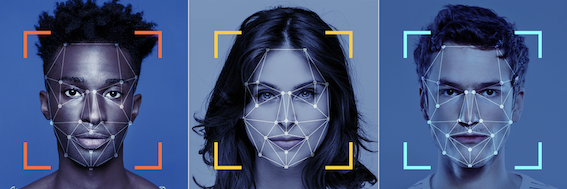

In this project you'll dive into face recognition framework and train neural network for face recognition task, play with losses and metrics.

This basic notebook will give you 8/10 points, if completed fully. There are also additional features you might implement to get additional points. You may do additional tasks and receive additional points even if you didn't fully complete the basic notebook. This means you can choose which tasks to do. **Additional features that you might implement are listed in Telegram chat**.

We will train neural network on [CelebA dataset](https://mmlab.ie.cuhk.edu.hk/projects/CelebA.html). 

As you see on the site, images of celebA dataset look like this:


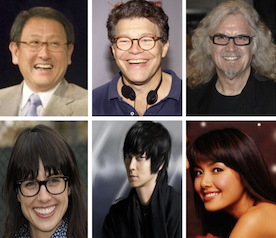

But we won't train a neural network for face recognition on those images. We'll need to preprocess them first. Let's see why we need it and how we need to preprocess them.

Let's look at how face recognition systems work:

## Face recognition model training and inference setup

This section describes how face recognition models are trained, what data alignment is and how the inference of face recognition model looks like. If you are familiar with this, you can skip this section.

### Model training

To train face recognition model on any facial dataset images must be aligned first. This step is very important to achieve a good quality of face recognition.

What is alignment: it consists of three steps:
1. Given image, identify facial landmarks on the image (coordinates of eyes, nose and mouth points). Separate neural network can be used there which was trained to identify landmarks on facial images. You can refer to [PyTorch Landmarks tutorial](https://pytorch.org/tutorials/beginner/data_loading_tutorial.html) to see how this works.
2. Rotate all the images in the dataset so that eyes of the person on every image lie on a certain pre-defined horizontal line.
3. Scale all the images in the dataset so that the size of the faces are approximately identical.

Here's an example of what we would get after alignment of all the images of Aaron Peirsol from our dataset:

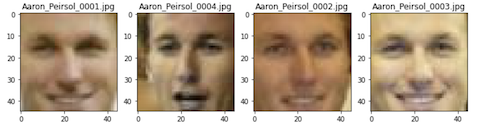

You see that eyes of all the faces lie on one horizontal line and all the faces have almost the same size. If we align all the images in the dataset, we can then train a neural network on aligned images.

**Why we need the alignment procedure**: the alignment of all faces in dataset makes the task of facial recognition easier for the model. If all the faces that model sees are of the same size and have their landmarks (eyes, nose, etc) on almost the same parts of the images, it is easier for the model to learn to identify a person on the image. The model doesn't need to "search" for the face and eyes positions on the image before performing a recognition.

If you are interested, you can also train a model on non-aligned images, but you'll see that it would perform badly. It is possible though to train a model for face recognition without pre-alignment of all the faces, but this would require a huge amount of data — more that almost any company has. The only company that has openly presented its face recognition system that does not require special alignment is Facebook — their neural network was trained on a really huge amount of data using a special trick to avoid alignment. You can read more details [here](https://research.fb.com/publications/deepface-closing-the-gap-to-human-level-performance-in-face-verification/)

### Model inference

So let's see how the model trained on aligned faces can be used in real world:

Let's assume you owe a company and you want to build a face recognition system for your working office. You decided to hang some cameras around the office and want them to be able to recognize faces of all your employees when they are sitting / walking around the office (we let you decide by yourself why you would need such a system in your office)


A system for face recognition typically conststs of 3 stages:
- face detection
- face alignment
- face recognition

Let's discuss them in detail:

**Face detection**

When the camera is hanged on the wall it records a video and splits the video into single images, like this:

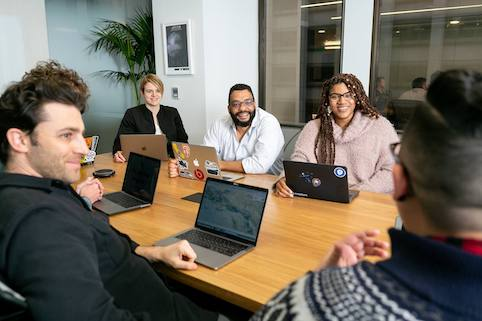

To be able to recognize all the faces on the photo you need first to detect all the faces that are present on the photo, like this:

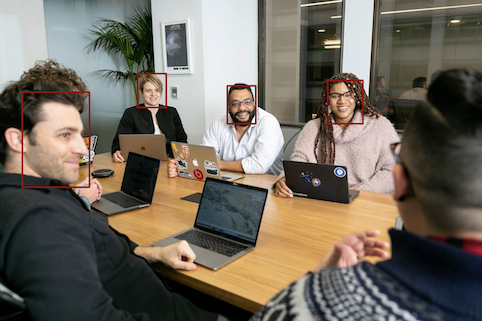

That is the first part — detection. You could use any neural network that can detect humans for this.

**Face alignment**

The second stage is to align all the faces found. The alignment procedure here should be the same as used to align training images.

So we'll get an image of a guy on a photo aligned like this:

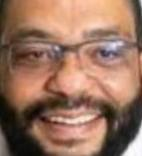

**Face recognition**

On the third stage we use the neural network that we trained to recognize a face.

So that's how the face recognition models pipeline work. You can also read about it more on [this link](https://www.nytimes.com/wirecutter/blog/how-facial-recognition-works/) (and using internet search)

## Neural network model architecture 

Let's discuss how model for face recognition should look like.



The easiest and, actually, the most used way to build a neural network for face recognition is to build it as a **simple classifier**.

Assume we have a dataset with photos of N different people. Then we can build a neural network to classify all the images from the dataset into N classes. Each class refers to one unique person in the dataset.

**How do we recognize new people by this network then?** We actually want the network for face recognition to be able to recognize not only the people which are in training set, but almost every person in the world.

That is how: after training the model, we'll drop it's last classification layer. After that when we'll pass an image of the person through network, we'll get the output of the pre-last layer — it's **the embedding of the image**. Having embeddings of two different images we can compare them using **cosine distance**. The less the distance is — the higher the probability that those two photos belong to one person is. 

Using that technique we can get embeddings of every image — even of unseen people, compare them, and reveal images belonging to same people. 

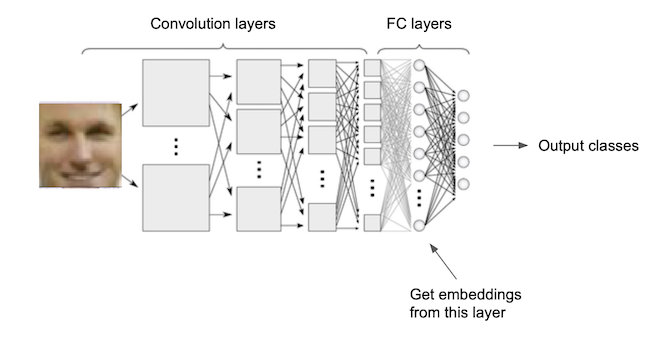

## Task 1 (2 points): build a neural network for faces classification as discribed above.

### Dataset 

We will train out face recognition network on part of the [CelebA dataset](https://mmlab.ie.cuhk.edu.hk/projects/CelebA.html). But we'll use a version of it that has all the images in it aligned and cropped. You can download the dataset using this link: https://disk.yandex.ru/d/S8f03spLIA1wrw or using the code below:

In [1]:
! pip install wldhx.yadisk-direct
! curl -L $(yadisk-direct https://disk.yandex.ru/d/S8f03spLIA1wrw) -o celebA_train.zip
! unzip -qq celebA_train.zip

Looking in indexes: https://pypi.yandex-team.ru/simple/
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100  162M  100  162M    0     0  59.9M      0  0:00:02  0:00:02 --:--:-- 74.7M--:-- 70.8M


Let's look at the data first:

In [2]:
! ls celebA_train_500/

celebA_anno.txt  celebA_imgs  celebA_train_split.txt


- celebA_imgs — folder with aligned images 
- celebA_anno.txt — file with annotations: which person each image corresponds to
- celebA_train_split.txt — file with train/val/test info

In [1]:
import cv2

from IPython.display import clear_output

import matplotlib.pyplot as plt

import numpy as np

import os

from PIL import Image

import random

from skimage import io, transform

import torch
from torch import nn
import torch.nn.functional as F 
from torch.utils.data import Dataset

from torchmetrics.functional import pairwise_cosine_similarity

import torchvision.transforms as transforms
from torchvision import models
from torchvision.models import resnet50, ResNet50_Weights
from torchvision.utils import make_grid


from tqdm import tqdm, notebook

Let's visualize some images to understand what we're dealing with:

Images size (width, height): (178, 218).


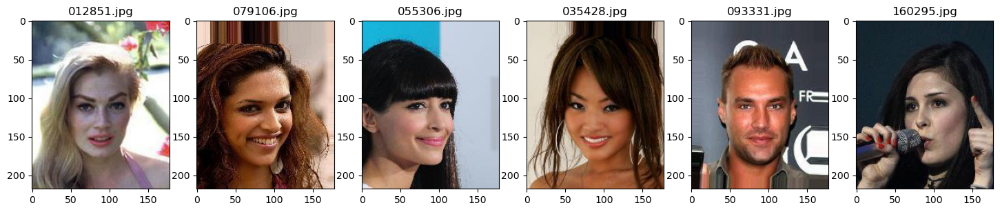

In [2]:
def show_imgs(images_names):
    imgs = []
    for img in images_names:
        img = Image.open(os.path.join('celebA_train_500/celebA_imgs/', img))
        imgs.append(np.array(img))
        
    print(f"Images size (width, height): {img.size}.")

    f, axes= plt.subplots(1, len(imgs), figsize=(3*len(imgs),5))
    for i, axis in enumerate(axes):
        axes[i].imshow(imgs[i], cmap='gray')
        axes[i].set_title(images_names[i])
    plt.show()

images_names = os.listdir('./celebA_train_500/celebA_imgs/')[:6]
show_imgs(images_names)

### Train Neural Network

Let's build a Datasets and network using this images:

In [3]:
def get_paths(dataset_type='train'):
    '''
    a function that returnes list of images paths for a given type of the dataset
    params:
      dataset_type: one of 'train', 'val', 'test'
    '''

    labels_dict = {
        'train': 0,
        'val': 1,
        'test': 2,
    }

    f = open('celebA_train_500/celebA_train_split.txt', 'r')
    lines = f.readlines()
    f.close()

    lines = [x.strip().split() for x in lines]
    lines = [x[0] for x in lines if int(x[1]) == labels_dict[dataset_type]]

    images_paths = []
    for filename in lines:            
        images_paths.append(os.path.join('celebA_train_500/celebA_imgs/', filename))
    
    return np.array(images_paths)


class celebADataset(Dataset):
    """Feel free to rewrite it. For ex. cache all images in RAM to increase training speed"""
    def __init__(self, dataset_type, transform):
        self.images_paths = get_paths(dataset_type=dataset_type)

        f = open('celebA_train_500/celebA_anno.txt', 'r')
        labels = f.readlines()
        f.close()
        labels = [x.strip().split() for x in labels]
        labels = {x:y for x, y in labels}
        self.labels = [int(labels[x.split('/')[-1]]) for x in self.images_paths]
        
        self.transform = transform
        
        '''
        We apply crop to the size 83x100 to make images similar to images from CelebA_ir datasets
        It is not center crop because images in CelebA_ir have different alignment
        '''
        a = 47
        b = 75
        image_to_tensor = transforms.ToTensor()
        self.images = [image_to_tensor(Image.open(x).crop((a, b, 83+a, 100+b))) for x in self.images_paths]
        
    
    def __len__(self):
        return len(self.images)
    
    def __getitem__(self, idx):        
        label = self.labels[idx]
        image = self.images[idx]
        
        sample = {
            'image': self.transform(image),
            'label': label,
        }

        return sample

In celebADataset class we crop images to the size 83x100 to make images similar to images from CelebA_ir datasets from the next task. It is not center crop because images in CelebA_ir have different alignment.

After that we apply CenterCrop to size 83x83 and then resize images to ImageNet dataset images size (224x224) and apply default ImageNet normalization, because we use model pretrained on ImageNet.

The only augmentation technique is HorizontalFlip.

In [4]:
celeba_images_size = 83
imagenet_images_size = 224

# for train
transform_with_aug = transforms.Compose([
      transforms.CenterCrop(celeba_images_size),
      transforms.RandomHorizontalFlip(),
      transforms.Resize(imagenet_images_size),
      transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225)),
])

# for val and test
transform = transforms.Compose([
      transforms.CenterCrop(celeba_images_size),
      transforms.Resize(imagenet_images_size),
      transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225)),
])

# for demonstration
transform_with_aug_without_norm = transforms.Compose([
      transforms.CenterCrop(celeba_images_size),
      transforms.RandomHorizontalFlip(),
      transforms.Resize(imagenet_images_size),
])

train_data = celebADataset('train', transform_with_aug)
val_data = celebADataset('val', transform)
test_data = celebADataset('test', transform)

val_data_for_img_plot = celebADataset('val', transform_with_aug_without_norm)

batch_size = 128
train_loader = torch.utils.data.DataLoader(train_data, batch_size=batch_size, shuffle=True)
val_loader = torch.utils.data.DataLoader(val_data, batch_size=batch_size, shuffle=False)
test_loader = torch.utils.data.DataLoader(test_data, batch_size=batch_size, shuffle=False)

val_loader_for_img_plot = torch.utils.data.DataLoader(val_data_for_img_plot, batch_size=batch_size, shuffle=True)

Let's take a look at image and label data shape after transforms and batching:

torch.Size([128, 3, 224, 224])
torch.Size([128])


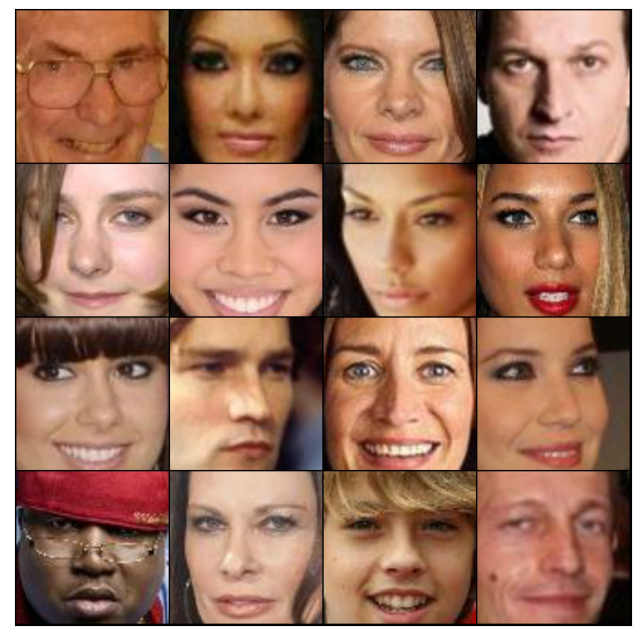

In [14]:
def show_images(images, nmax=16):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(images[:nmax], nrow=4).permute(1, 2, 0))

for batch in val_loader_for_img_plot:
    break
    
print(batch['image'].shape)
print(batch['label'].shape)

show_images(batch['image'], 16)

Now let's check that all labels are from range(num_classes) and all validate and test labels are present in the train set.

In [15]:
train_labels = set()

for batch in train_loader:
    train_labels = train_labels.union(set(batch['label'].numpy()))
    
num_classes = len(train_labels)
print(f"Total number of classes: {num_classes}.")

for i in range(num_classes):
    assert i in train_labels

for batch in val_loader:
    assert train_labels.issuperset(set(batch['label'].numpy()))
    
for batch in test_loader:
    assert train_labels.issuperset(set(batch['label'].numpy()))

Total number of classes: 500.


**Workflow**: train a model on train_data using val_data for validation. Use standard CE loss. Calculate the loss and accuracy on test set after training. 

You may use whatever model you want, including pre-trained on ImageNet models from torchvision. Please note, that **it is not allowed to use pre-trained models on any other dataset except ImageNet**. 

To get higher score, try to adjust hyperparameters, maybe try augmentations, etc. 

Hints: Do not use too big model. Small ResNet-like network is enough to get the required score. Use at least 2 linear layers on the bottom. You'll need to drop the last layer after training and get image embeddings from the pre-last layer. It's not required to get the embedding from linear layer though: you may get it from last convolution layer, if you want.

**To get the whole mark for this section you need to achieve 70% accuracy on test set**.

In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Our device is {device}!")

Our device is cuda!


Functions to fit and eval one epoch:

In [8]:
def fit_epoch(model, train_loader, criterion, optimizer):
    num_correct = 0
    total_loss = 0
    num_samples = 0
    num_batches = 0
    for batch in train_loader:
        images = batch['image'].to(device)
        target = batch['label'].to(device)
        
        model.train()
        optimizer.zero_grad()
        logits, _ = model(images)
        
        loss = criterion(logits, target)
        loss.backward()
        optimizer.step()
        
        y_pred = torch.argmax(logits, dim=1)
                
        num_correct += torch.sum(y_pred == target).item()
        num_samples += len(target)
        total_loss += loss.item()
        num_batches += 1

    train_accuracy = num_correct / num_samples
    train_loss = total_loss / num_batches
    return train_accuracy, train_loss

def eval_epoch(model, val_loader, criterion):
    num_correct = 0
    total_loss = 0
    num_samples = 0
    num_batches = 0
    for batch in val_loader:
        images = batch['image'].to(device)
        target = batch['label'].to(device)
        
        model.eval()
        with torch.no_grad():
            logits, _ = model(images)
            loss = criterion(logits, target)
            
        y_pred = torch.argmax(logits, dim=1)
                
        num_correct += torch.sum(y_pred == target).item()
        num_samples += len(target)
        total_loss += loss.item()
        num_batches += 1

    val_accuracy = num_correct / num_samples
    val_loss = total_loss / num_batches
    return val_accuracy, val_loss

Our model is based on AlexNet pretrained on ImageNet dataset:

In [53]:
face_vector_size = 256

class FaceClassifier(nn.Module):
    def __init__(self):
        super().__init__()
        self.pretrained_model = models.alexnet(pretrained=True)
        self.pretrained_model.classifier = nn.Sequential(
            nn.Linear(9216, 2048),
            nn.BatchNorm1d(2048),
            nn.ReLU(),
            nn.Linear(2048, face_vector_size),
            nn.BatchNorm1d(face_vector_size),
        )
        self.faces_classifier = nn.Sequential(
            nn.ReLU(),
            nn.Linear(face_vector_size, num_classes),
        )      
        
    def forward(self, x):
        face_vectors = self.pretrained_model(x)
        logits = self.faces_classifier(face_vectors)
        
        return logits, face_vectors

Train model and plot accuracy and loss for train and val datasets after each epoch:

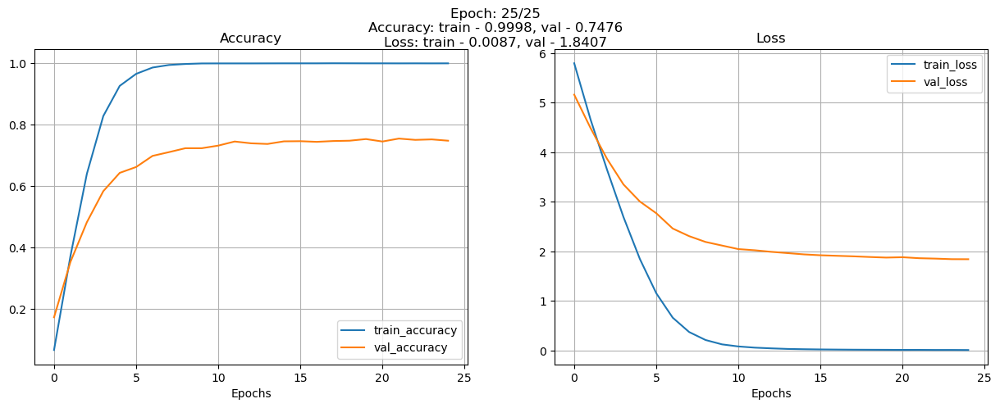

In [10]:
criterion = nn.CrossEntropyLoss()

model = FaceClassifier().to(device)

optimizer = torch.optim.Adam(model.parameters(), lr=3e-4)

num_epochs = 25

train_accs = []
train_losses = []

val_accs = []
val_losses = []

for epoch in range(num_epochs):
    train_accuracy, train_loss = fit_epoch(model, train_loader, criterion, optimizer)
    train_accs.append(train_accuracy)
    train_losses.append(train_loss)
    
    val_accuracy, val_loss = eval_epoch(model, val_loader, criterion)
    val_accs.append(val_accuracy)
    val_losses.append(val_loss)
    
    clear_output(wait=True)
    plt.figure(figsize=(15, 5))

    plt.subplot(1, 2, 1)
    plt.plot(train_accs, label="train_accuracy")
    plt.plot(val_accs, label="val_accuracy")
    plt.legend(loc="best")
    plt.xlabel("Epochs")
    plt.grid()
    plt.title("Accuracy")
            
    plt.subplot(1, 2, 2)
    plt.plot(train_losses, label="train_loss")
    plt.plot(val_losses, label="val_loss")
    plt.legend(loc="best")
    plt.xlabel("Epochs")
    plt.grid()
    plt.title("Loss")
    
    plt.suptitle(f"Epoch: {epoch+1}/{num_epochs}\nAccuracy: train - {train_accuracy:0.4f}, val - {val_accuracy:0.4f}\nLoss: train - {train_loss:0.4f}, val - {val_loss:0.4f}")
    plt.show()

Code for model evaluating (you can modify it if you want):

In [55]:
def evaluate(model, dataloader, loss_fn):

    losses = []

    num_correct = 0
    num_elements = 0

    for i, batch in enumerate(dataloader):
        
        X_batch, y_batch = batch['image'], batch['label']
        num_elements += len(y_batch)
        
        model.eval()
        with torch.no_grad():
            logits, _ = model(X_batch.to(device))
            loss = loss_fn(logits, y_batch.to(device))
            
        losses.append(loss.item())
            
        y_pred = torch.argmax(logits, dim=1)
            
        num_correct += torch.sum(y_pred.cpu() == y_batch)
    
    accuracy = num_correct / num_elements
            
    return accuracy.numpy(), np.mean(losses)

In [12]:
test_accuracy, test_loss = evaluate(model, test_loader, nn.CrossEntropyLoss())
print(f"Test accuracy: {test_accuracy.item():0.4f}, test loss: {test_loss.item():0.4f}.")

Test accuracy: 0.7552, test loss: 1.7907.


Save our model for further usage:

In [57]:
torch.save(model.state_dict(), "model_bce.pth")

Reload model and check that quality is the same:

In [58]:
num_classes = 500
model = FaceClassifier().to(device)
model.load_state_dict(torch.load("model_bce.pth"));

test_accuracy, test_loss = evaluate(model, test_loader, nn.CrossEntropyLoss())
print(f"Test accuracy: {test_accuracy.item():0.4f}, test loss: {test_loss.item():0.4f}.")

Test accuracy: 0.7552, test loss: 1.7907.


**Cosine similarity calculation**: drop the last layer of trained network. Get embeddings for some images from train set and for images from test set. Calculate cosine similarities between embeddings corresponding to the pictures of the same person and different people. Is the difference big in any of cases?

In [15]:
def calc_face_features(model, loader):
    targets = []
    face_features = []

    for batch in loader:
        images = batch['image'].to(device)
        target = batch['label'].tolist()

        targets += target

        model.eval()
        with torch.no_grad():
            _, batch_face_features = model(images)

        face_features += batch_face_features.tolist()
        
    return targets, face_features

In [16]:
test_targets, test_face_features = calc_face_features(model, test_loader)
train_targets, train_face_features = calc_face_features(model, train_loader)

In [17]:
def calc_similarities(targets, face_features, num_examples=5000):
    same_person_similarities = []
    for i in range(num_examples):
        j = 0
        k = 0
        while (j == k) or (targets[j] != targets[k]):
            j = random.randint(0, len(targets)-1)
            k = random.randint(0, len(targets)-1)
        a = face_features[j]
        b = face_features[k]
        cos_sim = np.dot(a, b)/(np.linalg.norm(a)*np.linalg.norm(b))
        same_person_similarities.append(cos_sim)

    different_person_similarities = []
    for i in range(num_examples):
        j = 0
        k = 0
        while (j == k) or (targets[j] == targets[k]):
            j = random.randint(0, len(targets)-1)
            k = random.randint(0, len(targets)-1)
        a = face_features[j]
        b = face_features[k]
        cos_sim = np.dot(a, b)/(np.linalg.norm(a)*np.linalg.norm(b))
        different_person_similarities.append(cos_sim)
    
    return same_person_similarities, different_person_similarities

In [18]:
test_same_person_sim, test_different_person_sim = calc_similarities(test_targets, test_face_features)
train_same_person_sim, train_different_person_sim = calc_similarities(train_targets, train_face_features)

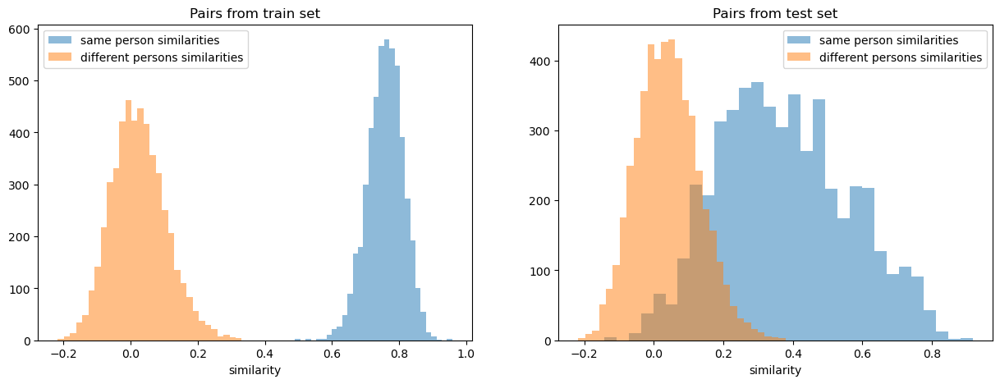

In [19]:
plt.figure(figsize=(15, 5))

plt.subplot(1, 2, 1)
plt.hist(train_same_person_sim, bins=30, alpha=0.5, label='same person similarities')
plt.hist(train_different_person_sim, bins=30, alpha=0.5, label='different persons similarities')
plt.legend(loc='best')
plt.xlabel('similarity')
plt.title('Pairs from train set')

plt.subplot(1, 2, 2)
plt.hist(test_same_person_sim, bins=30, alpha=0.5, label='same person similarities')
plt.hist(test_different_person_sim, bins=30, alpha=0.5, label='different persons similarities')
plt.legend(loc='best')
plt.xlabel('similarity')
plt.title('Pairs from test set')
            
plt.show()

As we can see, there is a noticeable gap between same person and different persons cosine similarities distribution for the train set. For different persons we have distribution with approximately 0.0 mean and for the same persons similarities we have distribution with mean value near 0.8.

For the test set similarities distrubution for different persons looks exactly the same as for the train set. But test set distribution of similarities for the same person features is not as good as for the train set. It has mean value aroud 0.4 instead of 0.8, much bigger variance, and overlaps with distribution for different persons.

**Cosine similarity distribution**: calculate all the cosine similarities between images in test dataset and train dataset of the same person. This means if you have image of person #106 in test dataset, calculate all similarities between this person's embeddings from test dataset and this person's embeddings from train dataset. 

Then also do that for pairs of different people. This means if you have image of person #106 in test dataset, calculate similarities between this person's embeddings from test dataset and other people embeddings from train dataset.

Visualize (build histograms) the cosine similarities distributions for same and different people.

This calculation may take a long time and memory since it's a lot of pairs. You can cut the number of pairs which you calculate distances between. For example, use 1000-5000 examples.

In [20]:
min_num_examples = 5000

same_person_sims = []
other_person_sims = []

while len(same_person_sims) < min_num_examples:
    
    target = random.randint(0, num_classes-1)
    
    test_set_indices = []
    for j in range(len(test_targets)):
        if test_targets[j] == target:
            test_set_indices.append(j)
    
    same_person_indices = []
    for j in range(len(train_targets)):
        if train_targets[j] == target:
            same_person_indices.append(j)
    
    other_person_indices = []
    while len(other_person_indices) < len(same_person_indices):
        j = random.randint(0, len(train_targets)-1)
        if train_targets[j] != target:
            other_person_indices.append(j)
    
    for test_set_index in test_set_indices:
        a = test_face_features[test_set_index]
        for same_person_index in same_person_indices:          
            b = train_face_features[same_person_index]
            cos_sim = np.dot(a, b)/(np.linalg.norm(a)*np.linalg.norm(b))
            same_person_sims.append(cos_sim)
        for other_person_index in other_person_indices:          
            b = train_face_features[other_person_index]
            cos_sim = np.dot(a, b)/(np.linalg.norm(a)*np.linalg.norm(b))
            other_person_sims.append(cos_sim)

assert len(same_person_sims) == len(other_person_sims)

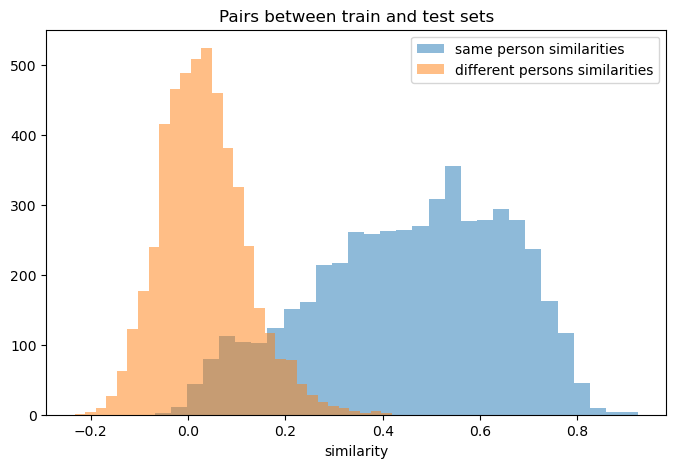

In [21]:
plt.figure(figsize=(8, 5))

plt.hist(same_person_sims, bins=30, alpha=0.5, label='same person similarities')
plt.hist(other_person_sims, bins=30, alpha=0.5, label='different persons similarities')
plt.legend(loc='best')
plt.xlabel('similarity')
plt.title('Pairs between train and test sets')
            
plt.show()

Distribution for different persons looks similar to the previous cases for pairs from test and train sets.

Distribution for the same person is something in between cases for train and test set pairs. It still overlaps with distribution for different persons but mean value now is obviously bigger than 0.4.

I don't know what conclusions I supposed to do looking at this, but results look pretty expected.

## Task 2 (2 points): Identificaton rate metric

When training the model above we used CE loss on val and test set as a measure of performance of our model. But this has a major disadvantage: we can't measure how good a model would work on unseen faces (which are not present in training, val & test sets)

To address this we can calculate another metric for the model: **identification rate**. This is how it works:

We have two sets of faces: query and distractors. None of the faces from those sets are present in train, val or test sets.

1. calculate cosine similarities between all the faces corresponding to the same people from query dataset. This means if the person has 3 photos in query part: 01.jpg, 02.jpg, 03.jpg, then calculate 3 cosine similarities between every pair of embeddings corresponding to those photos. 
2. calculate cosine similarities between all the faces corresponding to the different people from query dataset. 
3. calculate cosine similarities between all the pairs of embeddings corresponding to query and distractors. This means calculate similarities between pairs (q, d), where q is the embedding that corresponds to a face from query, d — embedding that corresponds to a face from distractors. You'll get |query|*|distractors| similarities.
4. Sum numbers of similarities from 2 and 3 stages. This is a number of false pairs.
5. fix **FPR** (false positive rate). Let it be 0.01 in our case. FPR multiplied by a number of false pairs from the stage 4 is the number of false positives we would allow our model to make. Let's call this number N
6. Sort all the similarities of false pairs by descending order. Get the Nth element from the beginning — that's our **threshold similarity**.
7. Calculate how many positive similarities from stage 1 are equal or more that threshold. Divide this number by whole number of positive similarities from stage 1. This is TPR (true positive rate) — our metric.

This metric can also be expressed as TPR@FPR=0.01. FPR can vary. 

Datasets (query photos, query labels & distructors photos) you can download using the code below:

In [63]:
! curl -L $(yadisk-direct https://disk.yandex.com/d/KN4EEkNKrF_ZXQ) -o celebA_ir.zip
! unzip -qq celebA_ir.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100 8978k  100 8978k    0     0  24.6M      0 --:--:-- --:--:-- --:--:-- 24.6M


**Task**: implement the TPR@FPR metric. Calculate it for your model and test dataset on FPR=[0.5, 0.2, 0.1, 0.05].

There're some functions pre-defined and some tests given for better understanding. Please don't change the functions prototypes, so that you can use asserts for checking.


In [34]:
from collections import defaultdict

# file with query part annotations: which image belongs to which class
# format: 
#     image_name_1.jpg 2678
#     image_name_2.jpg 2679
f = open('./celebA_ir/celebA_anno_query.csv', 'r')
query_lines = f.readlines()[1:]
f.close()
query_lines = [x.strip().split(',') for x in query_lines]
# plain list of image names from query. Need to compute embeddings for query
query_img_names = [x[0] for x in query_lines]

# dictionary with info of which images from query belong to which class
# format:
#     {class: [image_1, image_2, ...]}
query_dict = defaultdict(list)
for img_name, img_class in query_lines:
    query_dict[img_class].append(img_name)

# list of distractor images
distractors_img_names = os.listdir('./celebA_ir/celebA_distractors') 

Let's take a look at images from query dataset:

Images size (width, height): (83, 100).


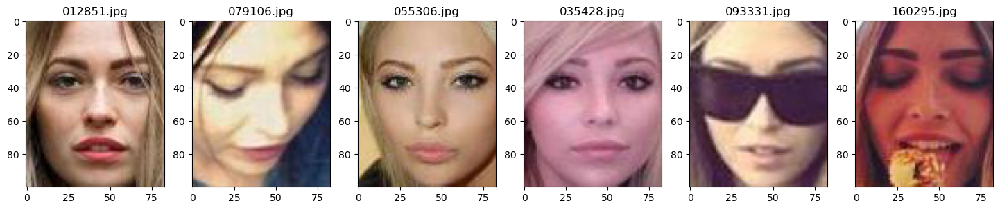

In [35]:
imgs = []
for img in query_img_names[:6]:
    img = Image.open(os.path.join('celebA_ir/celebA_query/', img))
    imgs.append(np.array(img))
    
print(f"Images size (width, height): {img.size}.")

f, axes= plt.subplots(1, len(imgs), figsize=(3*len(imgs),5))
for i, axis in enumerate(axes):
    axes[i].imshow(imgs[i], cmap='gray')
    axes[i].set_title(images_names[i])
plt.show()

Let's take a look at images from distractors dataset:

Images size (width, height): (83, 100).


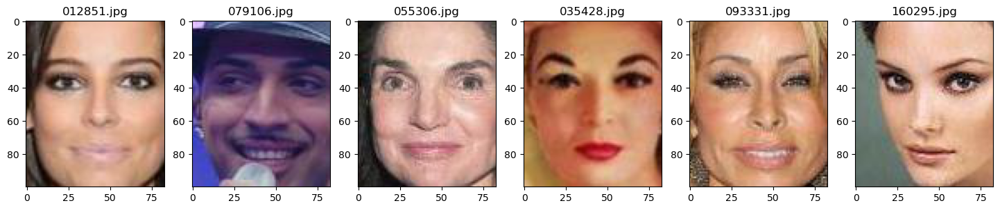

In [36]:
imgs = []
for img in distractors_img_names[:6]:
    img = Image.open(os.path.join('celebA_ir/celebA_distractors/', img))
    imgs.append(np.array(img))
    
print(f"Images size (width, height): {img.size}.")

f, axes= plt.subplots(1, len(imgs), figsize=(3*len(imgs),5))
for i, axis in enumerate(axes):
    axes[i].imshow(imgs[i], cmap='gray')
    axes[i].set_title(images_names[i])
plt.show()

Looks like all images are 83x100 - it's good that we foresaw it in Task 1 :-)

In [54]:
def compute_embeddings(model, images_list, folder_name):
    '''
    compute embeddings from the trained model for list of images.
    params:
        model: trained nn model that takes images and outputs embeddings
        images_list: list of images paths to compute embeddings for
    output:
        list: list of model embeddings. Each embedding corresponds to images 
              names from images_list
    '''
      
    celeba_images_size = 83
    imagenet_images_size = 224
    transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.CenterCrop(celeba_images_size),
        transforms.Resize(imagenet_images_size),
        transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225)),
    ])
    images = [transform(Image.open(os.path.join(folder_name, x))) for x in images_list]
        
    face_features_list = []
    
    model.eval()
    with torch.no_grad():
        for image in images:
            image = image[None, :, :, :]
            _, face_features = model(image.to(device))
            face_features_list.append(face_features.tolist()[0])
    return face_features_list

In [59]:
query_embeddings = compute_embeddings(model, query_img_names, 'celebA_ir/celebA_query/')
distractors_embeddings = compute_embeddings(model, distractors_img_names, 'celebA_ir/celebA_distractors/')

In [42]:
def compute_cosine_query_pos(query_dict, query_img_names, query_embeddings):
    '''
    compute cosine similarities between positive pairs from query (stage 1)
    params:
        query_dict: dict {class: [image_name_1, image_name_2, ...]}. Key: class in 
                    the dataset. Value: images corresponding to that class
        query_img_names: list of images names
        query_embeddings: list of embeddings corresponding to query_img_names
    output:
        list of floats: similarities between embeddings corresponding 
                        to the same people from query list
    '''
    query_embeddings = np.array(query_embeddings)
    cosine_query_pos = []
    for query_class in query_dict:
        class_img_indexes = []
        for image_name in query_dict[query_class]:
            class_img_indexes.append(query_img_names.index(image_name))
        class_img_embeddings = torch.tensor(query_embeddings[class_img_indexes])
        class_pairwise_similarity = pairwise_cosine_similarity(
            class_img_embeddings, class_img_embeddings
        ).numpy()
        cosine_query_pos += class_pairwise_similarity[np.triu_indices(len(class_img_indexes), k=1)].tolist()
    return cosine_query_pos

def compute_cosine_query_neg(query_dict, query_img_names, query_embeddings):
    '''
    compute cosine similarities between negative pairs from query (stage 2)
    params:
        query_dict: dict {class: [image_name_1, image_name_2, ...]}. Key: class in 
                    the dataset. Value: images corresponding to that class
        query_img_names: list of images names
        query_embeddings: list of embeddings corresponding to query_img_names
    output:
        list of floats: similarities between embeddings corresponding 
                        to different people from query list
    '''
    query_embeddings = torch.tensor(query_embeddings)
    pairwise_similarity = pairwise_cosine_similarity(
        query_embeddings, query_embeddings
    ).numpy()
    cosine_query_neg = []
    for query_class_1 in query_dict:
        class_1_img_indexes = []
        for image_name_1 in query_dict[query_class_1]:
            class_1_img_indexes.append(query_img_names.index(image_name_1))
        class_1_pairwise_similarity = pairwise_similarity[class_1_img_indexes, :]
        for query_class_2 in query_dict:
            if query_class_1 >= query_class_2:
                continue
            class_2_img_indexes = []
            for image_name_2 in query_dict[query_class_2]:
                class_2_img_indexes.append(query_img_names.index(image_name_2))
            classes_pairwise_similarity = class_1_pairwise_similarity[:, class_2_img_indexes]
            cosine_query_neg += classes_pairwise_similarity.reshape(-1,).tolist()
    return cosine_query_neg

def compute_cosine_query_distractors(query_embeddings, distractors_embeddings):
    '''
    compute cosine similarities between negative pairs from query and distractors (stage 3)
    params:
        query_embeddings: list of embeddings corresponding to query_img_names
        distractors_embeddings: list of embeddings corresponding to distractors_img_names
    output:
        list of floats: similarities between pairs of people (q, d), where q is 
                        embedding corresponding to photo from query, d —
                        embedding corresponding to photo from distractors
    '''
    query_embeddings = torch.tensor(query_embeddings)
    distractors_embeddings = torch.tensor(distractors_embeddings)
    pairwise_similarity = pairwise_cosine_similarity(
        query_embeddings, distractors_embeddings
    ).numpy()
    cosine_query_distractors = pairwise_similarity.reshape(-1,).tolist()
    return cosine_query_distractors

In [60]:
cosine_query_pos = compute_cosine_query_pos(query_dict, query_img_names, 
                                            query_embeddings)
cosine_query_neg = compute_cosine_query_neg(query_dict, query_img_names, 
                                            query_embeddings)
cosine_query_distractors = compute_cosine_query_distractors(query_embeddings, 
                                                            distractors_embeddings)

Check you code of functions which compute similarities:

In [28]:
test_query_dict = {
    2876: ['1.jpg', '2.jpg', '3.jpg'],
    5674: ['5.jpg'],
    864:  ['9.jpg', '10.jpg'],
}
test_query_img_names = ['1.jpg', '2.jpg', '3.jpg', '5.jpg', '9.jpg', '10.jpg']
test_query_embeddings = [
                    [1.56, 6.45,  -7.68],
                    [-1.1 , 6.11,  -3.0],
                    [-0.06,-0.98,-1.29],
                    [8.56, 1.45,  1.11],
                    [0.7,  1.1,   -7.56],
                    [0.05, 0.9,   -2.56],
]

test_distractors_img_names = ['11.jpg', '12.jpg', '13.jpg', '14.jpg', '15.jpg']

test_distractors_embeddings = [
                    [0.12, -3.23, -5.55],
                    [-1,   -0.01, 1.22],
                    [0.06, -0.23, 1.34],
                    [-6.6, 1.45,  -1.45],
                    [0.89,  1.98, 1.45],
]

test_cosine_query_pos = compute_cosine_query_pos(test_query_dict, test_query_img_names, 
                                            test_query_embeddings)
test_cosine_query_neg = compute_cosine_query_neg(test_query_dict, test_query_img_names, 
                                            test_query_embeddings)
test_cosine_query_distractors = compute_cosine_query_distractors(test_query_embeddings, 
                                                            test_distractors_embeddings)

In [29]:
true_cosine_query_pos = [0.8678237233650096, 0.21226104378511604,
                         -0.18355866977496182, 0.9787437979250561]
assert np.allclose(sorted(test_cosine_query_pos), sorted(true_cosine_query_pos)), \
      "A mistake in compute_cosine_query_pos function"

true_cosine_query_neg = [0.15963231223161822, 0.8507997093616965, 0.9272761484302097,
                         -0.0643994061127092, 0.5412660901220571, 0.701307100338029,
                         -0.2372575528216902, 0.6941032794522218, 0.549425446066643,
                         -0.011982733001947084, -0.0466679194884999]
assert np.allclose(sorted(test_cosine_query_neg), sorted(true_cosine_query_neg)), \
      "A mistake in compute_cosine_query_neg function"

true_cosine_query_distractors = [0.3371426578637511, -0.6866465610863652, -0.8456563512871669,
                                 0.14530087113136106, 0.11410510307646118, -0.07265097629002357,
                                 -0.24097699660707042,-0.5851992679925766, 0.4295494455718534,
                                 0.37604478596058194, 0.9909483738948858, -0.5881093317868022,
                                 -0.6829712976642919, 0.07546364489032083, -0.9130970963915521,
                                 -0.17463101988684684, -0.5229363015558941, 0.1399896725311533,
                                 -0.9258034013399499, 0.5295114163723346, 0.7811585442749943,
                                 -0.8208760031249596, -0.9905139680301821, 0.14969764653247228,
                                 -0.40749654525418444, 0.648660814944824, -0.7432584300096284,
                                 -0.9839696492435877, 0.2498741082804709, -0.2661183373780491]
assert np.allclose(sorted(test_cosine_query_distractors), sorted(true_cosine_query_distractors)), \
      "A mistake in compute_cosine_query_distractors function"

Implement the final function: identification rate calculation

In [45]:
def compute_ir(cosine_query_pos, cosine_query_neg, cosine_query_distractors, 
               fpr=0.1):
    '''
    compute identification rate using precomputer cosine similarities between pairs at given fpr
    params:
        cosine_query_pos: cosine similarities between positive pairs from query
        cosine_query_neg: cosine similarities between negative pairs from query
        cosine_query_distractors: cosine similarities between negative pairs 
                                  from query and distractors
        fpr: false positive rate at which to compute TPR
    output: 
        float: threshold for given fpr 
        float: TPR at given FPR
    '''
    false_pairs = sorted(cosine_query_neg + cosine_query_distractors, reverse=True)
    num_false_pairs = len(false_pairs)
    num_fp = int(fpr * num_false_pairs)
    threshold = false_pairs[num_fp]
    tpr = sum(cos_sim >= threshold for cos_sim in cosine_query_pos) / len(cosine_query_pos)
    return threshold, tpr

Check yourself:

In [31]:
test_thr = []
test_tpr = []
for fpr in [0.5, 0.3, 0.1]:
    x, y = compute_ir(test_cosine_query_pos, test_cosine_query_neg, 
                    test_cosine_query_distractors, fpr=fpr)
    test_thr.append(x)
    test_tpr.append(y)

In [32]:
true_thr = [-0.011982733001947084, 0.3371426578637511, 0.701307100338029]
assert np.allclose(np.array(test_thr), np.array(true_thr)), "A mistake in computing threshold"

true_tpr = [0.75, 0.5, 0.5]
assert np.allclose(np.array(test_tpr), np.array(true_tpr)), "A mistake in computing tpr"

Finally compute tpr for faces query and distractors dataset and fpr = [0.5, 0.2, 0.1, 0.05]:

In [61]:
thr_bce = []
tpr_bce = []
fpr_list = [0.5, 0.2, 0.1, 0.05, 0.01]
for fpr in fpr_list:
    x, y = compute_ir(cosine_query_pos, cosine_query_neg, cosine_query_distractors, fpr=fpr)
    thr_bce.append(x)
    tpr_bce.append(y)
print(f"TPR values: {tpr_bce}")
print(f"Thresholds values: {thr_bce}")

TPR values: [0.9400855920114123, 0.8016439100604579, 0.6865022756606208, 0.5768629848515726, 0.36675497588479045]
Thresholds values: [0.07733284682035446, 0.15791548788547516, 0.2023070752620697, 0.24022646248340607, 0.3134016692638397]


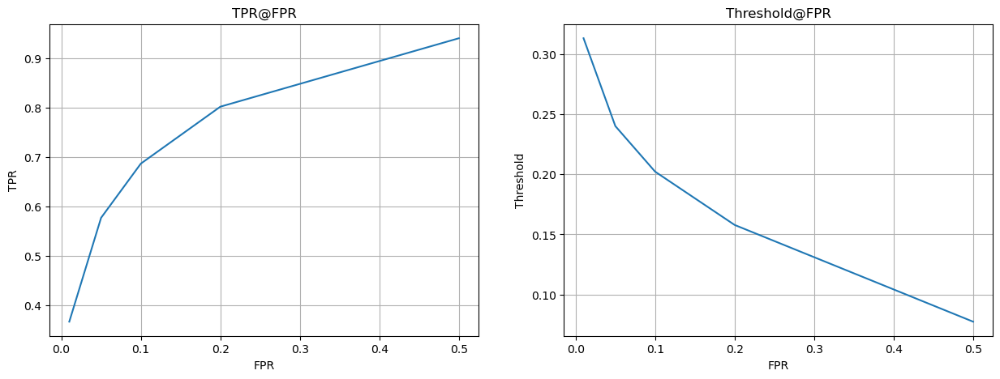

In [52]:
plt.figure(figsize=(15, 5))

plt.subplot(1, 2, 1)
plt.plot(fpr_list, tpr_bce)
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.grid()
plt.title("TPR@FPR")
            
plt.subplot(1, 2, 2)
plt.plot(fpr_list, thr_bce)
plt.xlabel("FPR")
plt.ylabel("Threshold")
plt.grid()
plt.title("Threshold@FPR")
    
plt.show()

## Task 3 (4 points): Loss functions

Building a network on task 1 we used an ordinary CE loss. But there are many more variants of loss functions that can be used to train neural network. We will discuss two of them, which are the most popular. More examples of losses for face recognition and their performance reviews you can find in this paper: https://arxiv.org/pdf/1901.05903.pdf

### TripletLoss (2 points)

This is another kind of loss which does not require a model to have last classification layer — it works directly with embeddings. It requires by design to make embeddings of one person be close on embeddings space and embeddings of different people be far away from each other. 

This loss has an advantage over CE-like losses: it does not rely on number of classes in dataset. If we have new faces of new people in a dataset, we won't need to completely retrain the network, we could just fine-tune the trained network on new photos.


**How TripletLoss works**:

Here the architecture of neural network will be slightly different than it was when we used CE loss: it won't have the last classification layer. The last layer of NN will output embeddings of the given photo. 

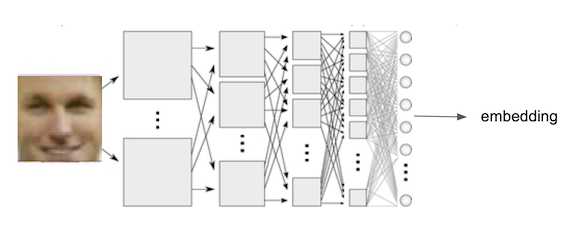

The TripletLoss function works directly with these embeddings. The idea of it is to make embeddings of the same people more close, compact in the embedding space, and the embeddings of the different people be more separate. There's a formula for the loss:

$$L(e, p, n) = max\{d(a, p) - d(a, n) + margin, 0\},$$

where 
- $e$ is embedding of a photo (output of a model)
- $p$ is a positive embedding for the photo (embedding that we want $e$ be close to)
- $n$ is a negative embedding for the photo (embedding that we want $e$ be far from)
- $d(x, y)$ is a distance measure between embeddings 
- margin — a positive margin to further boost the difference between $d(a, p)$ and $d(a, n)$

**All the embeddings $e$, $p$ and $n$ must be normalized before passing them to the loss**.

In our case for the given photo $E$ and it's embedding $e$ positive embedding $p$ must be an embedding of the photo of the same person and embedding $n$ must be an embedding of the photo of the different person.

This implementation of TripletLoss for PyTorch can be found [here](https://pytorch.org/docs/stable/generated/torch.nn.TripletMarginWithDistanceLoss.html#torch.nn.TripletMarginWithDistanceLoss). There are different variants of TripletLoss which can also boost performance and which you can implement by yourself, if you want:
- use more that 1 sample of $p$ and $n$ for one embedding $e$ 
- use special kinds of negatives: e.g. the negatives that are the most close to e (to boost them be further away from e)


**More to read about TripletLoss**:

The idea of TripletLoss: https://en.wikipedia.org/wiki/Triplet_loss

PyTorch implementation of TripletLoss: https://pytorch.org/docs/stable/generated/torch.nn.TripletMarginWithDistanceLoss.html#torch.nn.TripletMarginWithDistanceLoss

**Task**: implement a model and train it with TripletLoss. Play with margin parameter to achieve better results. Again, you might use whatever architecture you prefer, including ImageNet pre-trained networks. Do not use pre-trained networks on any other dataset.

Which loss among which you have tried is the best?

**To get the full mark for this task you need to train a model using  TripletLoss correctly at least for one value of margin and achieve >=70% acc on test set.** 
As we don't have a classification layer in our network, we need a custom procedure for accuracy calculation. You can use one of the following procedures:
- calculate accuracy on val and test sets using KNN with embeddings from training set as training points. (easy way)
- compute mean embeddings for every class from training set and use them as reference embeddings. Then for every embeddings from val and test sets calculate cosine similarities be 

**Hints**:
- think of what the distance function $d$ should be in our case: training a model we want it to output embeddings which can be compared using cosine similarity function. Pay attention to that cosine similarity is not a distance measure — the more cosine distance, the closer embeddings are. Think how you can put cosine distance into TripletLoss function.
- to train model using this loss you'll need to rewrite the Dataset class so it gives you not the random image and its label, but the image, positive images and negative images for this image;
- don't forget to normalize embeddings for the loss! You may even do that by adding batchnorm/layernorm to the last layer of your network

We will use new Dataset class: it returns anchor, positive and negative examples. We use just random examples because it works! For special case when random positive example is the same picrute as anchor we apply HorizontalFlip to anchor.

In [168]:
import random

class celebADatasetTripletTrain(Dataset):
    """Feel free to rewrite it. For ex. cache all images in RAM to increase training speed"""
    def __init__(self, dataset_type, transform, aug=None):
        self.images_paths = get_paths(dataset_type=dataset_type)

        f = open('celebA_train_500/celebA_anno.txt', 'r')
        labels = f.readlines()
        f.close()
        labels = [x.strip().split() for x in labels]
        labels = {x:y for x, y in labels}
        self.labels = [int(labels[x.split('/')[-1]]) for x in self.images_paths]
        
        self.flip = transforms.Compose([
            transforms.RandomHorizontalFlip(p=1),
        ])
        
        self.aug = aug
        
        '''
        We make crop to the size 83x100 to make images similar to images from CelebA_ir datasets
        It is not center crop because images in CelebA_ir have different alignment
        '''
        a = 47
        b = 75
        self.images = [transform(Image.open(x).crop((a, b, 83+a, 100+b))) for x in self.images_paths]
        
    
    def __len__(self):
        return len(self.images)
    
    def __getitem__(self, idx):        
        label = self.labels[idx]
        if self.aug:
            anchor = self.aug(self.images[idx])
        else:
            anchor = self.images[idx]
        
        positive_indices = [i for i, x in enumerate(self.labels) if x == label]
        positive_index = random.choice(positive_indices)
        if positive_index != idx:
            if self.aug:
                positive = self.aug(self.images[positive_index])
            else:
                positive = self.images[positive_index]
        else:
            positive = self.flip(anchor)
        
        negative_indices = [i for i, x in enumerate(self.labels) if x != label]
        if self.aug:
            negative = self.aug(self.images[random.choice(negative_indices)])
        else:
            negative = self.images[random.choice(negative_indices)]
        
        sample = {
            'label': label,
            'anchor': anchor,
            'positive': positive,
            'negative': negative,
        }

        return sample

In [192]:
celeba_images_size = 83
imagenet_images_size = 224

transform = transforms.Compose([
      transforms.ToTensor(),
      transforms.CenterCrop(celeba_images_size),
      transforms.Resize(imagenet_images_size),
      transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225)),
])

aug = transforms.Compose([
      transforms.RandomHorizontalFlip(),
])

transform_without_norm = transforms.Compose([
      transforms.ToTensor(),
      transforms.CenterCrop(celeba_images_size),
      transforms.Resize(imagenet_images_size),
])

train_data = celebADatasetTripletTrain('train', transform, aug)
val_data = celebADatasetTripletTrain('val', transform)
test_data = celebADatasetTripletTrain('test', transform)

data_for_demo = celebADatasetTripletTrain('val', transform_without_norm)

batch_size = 128
train_loader = torch.utils.data.DataLoader(train_data, batch_size=batch_size, shuffle=True)
val_loader = torch.utils.data.DataLoader(val_data, batch_size=batch_size, shuffle=False)
test_loader = torch.utils.data.DataLoader(test_data, batch_size=batch_size, shuffle=False)

loader_for_demo = torch.utils.data.DataLoader(data_for_demo, batch_size=batch_size, shuffle=True)

Let's take a look at triplets. In each row first image is anchor, second is positive example, and third is negative example.

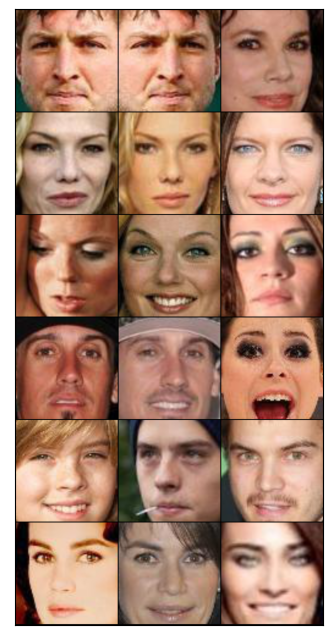

In [195]:
def show_images(images, nmax=16):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(images[:nmax], nrow=3).permute(1, 2, 0))

for batch in loader_for_demo:
    break

images = torch.empty((18,3,224,224))

for i in range(6):
    anchor = batch['anchor'][i][None, :, :, :]
    positive = batch['positive'][i][None, :, :, :]
    negative = batch['negative'][i][None, :, :, :]
    imgs = torch.cat((anchor, positive, negative))
    images[i*3:(i+1)*3, :, :, :] = imgs

show_images(images, 18)

For each epoch we estimate validate set accuracy by comparing validate embedding label with the label of the nearest embeding from train set. We use pairwise_cosine_similarity instead of KNN because it works fast.

In [118]:
def fit_and_eval_epoch(model, train_loader, val_loader, criterion, optimizer):
    total_loss = 0
    num_batches = 0
    train_face_features = None
    train_labels = None
    
    model.train()
    for batch in train_loader:
        label = batch['label']
        anchor = batch['anchor'].to(device)
        positive = batch['positive'].to(device)
        negative = batch['negative'].to(device)
        
        optimizer.zero_grad()
        
        anchor_embeddings = model(anchor)
        positive_embeddings = model(positive)
        negative_embeddings = model(negative)
        
        loss = criterion(anchor_embeddings, positive_embeddings, negative_embeddings)
        loss.backward()
        optimizer.step()
        
        total_loss += loss.item()
        num_batches += 1
        
        if train_face_features is None:
            train_face_features = anchor_embeddings
            train_labels = label
        else:
            train_face_features = torch.vstack((train_face_features, anchor_embeddings))
            train_labels = torch.cat((train_labels, label))
    train_loss = total_loss / num_batches
    
    total_loss = 0
    num_batches = 0
    num_correct = 0
    num_samples = 0
    
    model.eval()
    for batch in val_loader:
        label = batch['label']
        anchor = batch['anchor'].to(device)
        positive = batch['positive'].to(device)
        negative = batch['negative'].to(device)
        
        with torch.no_grad():
            anchor_embeddings = model(anchor)
            positive_embeddings = model(positive)
            negative_embeddings = model(negative)        
            loss = criterion(anchor_embeddings, positive_embeddings, negative_embeddings)
        
        total_loss += loss.item()
        num_batches += 1
        
        pairwise_similarity = pairwise_cosine_similarity(
            train_face_features, anchor_embeddings
        )
        nearest_embedings_indices = torch.argmax(pairwise_similarity, dim=0)
        nearest_labels = train_labels[nearest_embedings_indices.cpu()]
        num_correct += torch.sum(nearest_labels == label).item()
        num_samples += len(label)
    val_loss = total_loss / num_batches    
    val_accuracy = num_correct / num_samples
    return train_loss, val_loss, val_accuracy

The model is just the same as in BCE case, but without last FC layer. We do not normalize embeddings because it is not necessary for our loss function - F.cosine_similarity applies normalization by default. Also it allows us to use this model in bonus task - Finding trash photos.

In [47]:
face_vector_size = 256

class FaceEmbedder(nn.Module):
    def __init__(self):
        super().__init__()
        self.pretrained_model = models.alexnet(pretrained=True)
        self.pretrained_model.classifier = nn.Sequential(
            nn.Linear(9216, 2048),
            nn.BatchNorm1d(2048),
            nn.ReLU(),
            nn.Linear(2048, face_vector_size),
            nn.BatchNorm1d(face_vector_size),
        )     
        
    def forward(self, x):
        face_vectors = self.pretrained_model(x)       
        return face_vectors

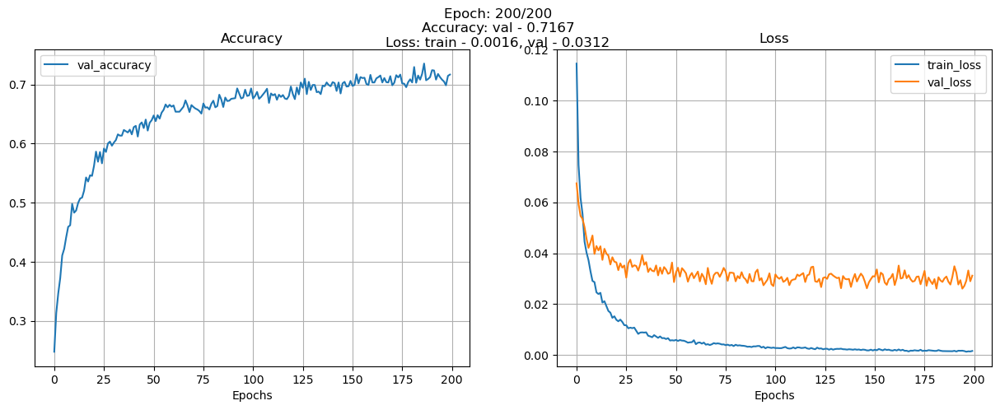

In [145]:
criterion = nn.TripletMarginWithDistanceLoss(
    distance_function=lambda x, y: 1.0 - F.cosine_similarity(x, y),
    margin=0.3
)

model = FaceEmbedder().to(device)

optimizer = torch.optim.Adam(model.parameters(), lr=5e-5)

num_epochs = 200

train_losses = []
val_losses = []
val_accs = []

for epoch in range(num_epochs):
    train_loss, val_loss, val_accuracy = fit_and_eval_epoch(model, train_loader, val_loader, criterion, optimizer)
    train_losses.append(train_loss)
    val_losses.append(val_loss)
    val_accs.append(val_accuracy)
    
    clear_output(wait=True)
    plt.figure(figsize=(15, 5))

    plt.subplot(1, 2, 1)
    plt.plot(val_accs, label="val_accuracy")
    plt.legend(loc="best")
    plt.xlabel("Epochs")
    plt.grid()
    plt.title("Accuracy")
            
    plt.subplot(1, 2, 2)
    plt.plot(train_losses, label="train_loss")
    plt.plot(val_losses, label="val_loss")
    plt.legend(loc="best")
    plt.xlabel("Epochs")
    plt.grid()
    plt.title("Loss")
    
    plt.suptitle(f"Epoch: {epoch+1}/{num_epochs}\nAccuracy: val - {val_accuracy:0.4f}\nLoss: train - {train_loss:0.4f}, val - {val_loss:0.4f}")
    plt.show()

In [184]:
torch.save(model.state_dict(), "model_triplet.pth")

In [48]:
model = FaceEmbedder().to(device)
model.load_state_dict(torch.load("model_triplet.pth"));

In [201]:
criterion = nn.TripletMarginWithDistanceLoss(
    distance_function=lambda x, y: 1.0 - F.cosine_similarity(x, y),
    margin=0.3
)

def evaluate_triplet(model, train_loader, test_loader, loss_fn):
    train_face_features = None
    train_labels = None
    
    for batch in train_loader:
        label = batch['label']
        anchor = batch['anchor'].to(device)
        
        model.eval()
        with torch.no_grad():
            anchor_embeddings = model(anchor)
                
        if train_face_features is None:
            train_face_features = anchor_embeddings
            train_labels = label
        else:
            train_face_features = torch.vstack((train_face_features, anchor_embeddings))
            train_labels = torch.cat((train_labels, label))
    
    total_loss = 0
    num_batches = 0
    num_correct = 0
    num_samples = 0
    
    for batch in test_loader:
        label = batch['label']
        anchor = batch['anchor'].to(device)
        positive = batch['positive'].to(device)
        negative = batch['negative'].to(device)
        
        model.eval()
        with torch.no_grad():
            anchor_embeddings = model(anchor)
            positive_embeddings = model(positive)
            negative_embeddings = model(negative)        
            loss = loss_fn(anchor_embeddings, positive_embeddings, negative_embeddings)
        
        total_loss += loss.item()
        num_batches += 1
        
        pairwise_similarity = pairwise_cosine_similarity(
            train_face_features, anchor_embeddings
        )
        nearest_embedings_indices = torch.argmax(pairwise_similarity, dim=0)
        nearest_labels = train_labels[nearest_embedings_indices.cpu()]
        num_correct += torch.sum(nearest_labels == label).item()
        num_samples += len(label)
    test_loss = total_loss / num_batches    
    test_accuracy = num_correct / num_samples
    return test_accuracy, test_loss

In [203]:
test_accuracy, test_loss = evaluate_triplet(model, train_loader, test_loader, criterion)
print(f"Test accuracy: {test_accuracy:0.4f}, test loss: {test_loss:0.4f}.")

Test accuracy: 0.7250, test loss: 0.0337.


Very good, test accuracy is more that 70%. Now let's take a look at TPR@FPR metric.

In [49]:
def compute_embeddings_triplet(model, images_list, folder_name):
    '''
    compute embeddings from the trained model for list of images.
    params:
        model: trained nn model that takes images and outputs embeddings
        images_list: list of images paths to compute embeddings for
    output:
        list: list of model embeddings. Each embedding corresponds to images 
              names from images_list
    '''
      
    celeba_images_size = 83
    imagenet_images_size = 224
    transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.CenterCrop(celeba_images_size),
        transforms.Resize(imagenet_images_size),
        transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225)),
    ])
    images = [transform(Image.open(os.path.join(folder_name, x))) for x in images_list]
        
    face_features_list = []
    
    model.eval()
    with torch.no_grad():
        for image in images:
            image = image[None, :, :, :]
            face_features = model(image.to(device))
            face_features_list.append(face_features.tolist()[0])
    return face_features_list

query_embeddings = compute_embeddings_triplet(model, query_img_names, 'celebA_ir/celebA_query/')
distractors_embeddings = compute_embeddings_triplet(model, distractors_img_names, 'celebA_ir/celebA_distractors/')

In [50]:
cosine_query_pos = compute_cosine_query_pos(query_dict, query_img_names, 
                                            query_embeddings)
cosine_query_neg = compute_cosine_query_neg(query_dict, query_img_names, 
                                            query_embeddings)
cosine_query_distractors = compute_cosine_query_distractors(query_embeddings, 
                                                            distractors_embeddings)

In [51]:
thr_triplet_loss = []
tpr_triplet_loss = []
fpr_list = [0.5, 0.2, 0.1, 0.05, 0.01]
for fpr in fpr_list:
    x, y = compute_ir(cosine_query_pos, cosine_query_neg, cosine_query_distractors, fpr=fpr)
    thr_triplet_loss.append(x)
    tpr_triplet_loss.append(y)
print(f"TPR values: {tpr_triplet_loss}")
print(f"Thresholds values: {thr_triplet_loss}")

TPR values: [0.9588343183207663, 0.8457985191223423, 0.7351402757964812, 0.6225799877725698, 0.385707492697507]
Thresholds values: [0.006376111414283514, 0.16546256840229034, 0.25391167402267456, 0.32881587743759155, 0.4670482873916626]


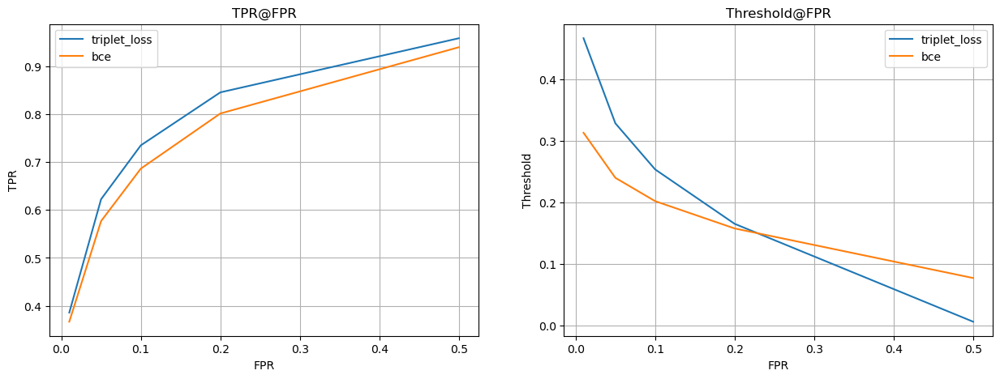

In [208]:
plt.figure(figsize=(15, 5))

plt.subplot(1, 2, 1)
plt.plot(fpr_list, tpr_triplet_loss, label="triplet_loss")
plt.plot(fpr_list, tpr_bce, label="bce")
plt.legend(loc="best")
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.grid()
plt.title("TPR@FPR")
            
plt.subplot(1, 2, 2)
plt.plot(fpr_list, thr_triplet_loss, label="triplet_loss")
plt.plot(fpr_list, thr_bce, label="bce")
plt.legend(loc="best")
plt.xlabel("FPR")
plt.ylabel("Threshold")
plt.grid()
plt.title("Threshold@FPR")
    
plt.show()

We see that despite accuracy on test is bigger for BCE (0.7552 vs. 0.7250), triplet loss shows better performance in terms of TPR@FPR metric. Triplet loss TPR is bigger for all values of our fixed FPR set.

### ArcFace Loss (Additive Angular Margin Loss) (2 points)

This loss is somewhat "SOTA" for face recognition systems (somewhat — because actually different variants of losses and their combinations may be the best for different network architectures). This loss inherits idea from CE loss but further develops it to achieve better embeddings distribution on a sphere. It introduces some geodesic constraints to enhance intra-class compactness and inter-class discrepancy.



**How ArcFace loss works**:

This loss is a variation of a standard SoftMax CE loss, which enforces embeddings of different classes (people) be further away: have a more sparse representation of embeddings in embedding space, enforce more evident gap between the nearest classes.

The standard SoftMax CE loss for classification task is presented as follows:

$$L_{CE} = \frac{-1}{N}\sum_1^N \frac{e^{W_{y_i}^{T}x_i + b_{y_i}}}{\sum^n_{j=1}e^{W_j^Tx_i+b_j}},$$

where:
- $x_i \in \mathbb{R^d}$ denotes the deep feature of the $i$-th sample, belonging to the $y_i$-th class;
- $W_j \in \mathbb{R^d}$ denotes the j-th column of the weight;
- $W \in \mathbb{R^d}$ and $b_j \in \mathbb{R^d}$ is the bias term;
- $N$ — batch size;
- $n$ — class number.

It appears, that, though this loss works well, it does not explicitly optimise the feature embedding to enforce higher similarity for intra- class samples and diversity for inter-class samples, which results in a performance gap for deep face recognition under large intra-class appearance variations.

Let's do some work on this loss formula:
- fix the bias $b_j=0$;
- normalize weight ||$W_j$|| = 1;
- normalize embedding ||$x_i$|| = 1 and re-scale it to s (s is a hyperparameter)

The normalisation step on embeddings and weights makes the predictions only depend on the angle between the embedding and the weight. The learned embeddings fare thus distributed on a hypersphere with a radius of s.

So we get the following loss function now:

$$L = \frac{-1}{N}\sum_1^N \frac{e^{s\ cos\Theta_{y_i}}}{e^{s\ cos\Theta_{y_i}} + \sum^n_{j=1,\ j\ne y_i} e^{s\ cos\Theta_j}}$$

Final step: let's add an additive angular margin penalty $m$ between $x_i$ and $W_{y_i}$ to simultaneously enhance the intra-class compactness and inter-class discrepancy:

$$L_{ArcFace} = \frac{-1}{N}\sum_1^N \frac{e^{s\ cos(\Theta_{y_i} + m)}}{e^{s\ cos(\Theta_{y_i} + m)} + \sum^n_{j=1,\ j\ne y_i} e^{s\ cos\Theta_j}}$$

SO this is an ArcFace loss. It has 2 hyperparameters: s and m.

The original paper to read about ArcFace more precisely: https://arxiv.org/pdf/1801.07698.pdf

The original repo, where you can find a code sample: https://github.com/deepinsight/insightface

**Task**: implement a model and train it with ArcFace loss. Play with ArcFace loss parameters and see if you can beat a model with CE loss. Again, you might use whatever architecture you prefer, including ImageNet pre-trained networks. Do not use pre-trained networks on any other dataset.

**To get the full mark for this task you need to train a model using TripletLoss correctly at least for one value of margin and achieve >=70% acc on test set.**

As a first step, we make the same dataloaders as in task1.

In [22]:
def get_paths(dataset_type='train'):
    '''
    a function that returnes list of images paths for a given type of the dataset
    params:
      dataset_type: one of 'train', 'val', 'test'
    '''

    labels_dict = {
        'train': 0,
        'val': 1,
        'test': 2,
    }

    f = open('celebA_train_500/celebA_train_split.txt', 'r')
    lines = f.readlines()
    f.close()

    lines = [x.strip().split() for x in lines]
    lines = [x[0] for x in lines if int(x[1]) == labels_dict[dataset_type]]

    images_paths = []
    for filename in lines:            
        images_paths.append(os.path.join('celebA_train_500/celebA_imgs/', filename))
    
    return np.array(images_paths)


class celebADataset(Dataset):
    """Feel free to rewrite it. For ex. cache all images in RAM to increase training speed"""
    def __init__(self, dataset_type, transform, aug=None):
        self.images_paths = get_paths(dataset_type=dataset_type)

        f = open('celebA_train_500/celebA_anno.txt', 'r')
        labels = f.readlines()
        f.close()
        labels = [x.strip().split() for x in labels]
        labels = {x:y for x, y in labels}
        self.labels = [int(labels[x.split('/')[-1]]) for x in self.images_paths]
        
        self.aug = aug
        
        '''
        We apply crop to the size 83x100 to make images similar to images from CelebA_ir datasets
        It is not center crop because images in CelebA_ir have different alignment
        '''
        a = 47
        b = 75
        self.images = [transform(Image.open(x).crop((a, b, 83+a, 100+b))) for x in self.images_paths]
        
    
    def __len__(self):
        return len(self.images)
    
    def __getitem__(self, idx):        
        label = self.labels[idx]
        
        if self.aug:
            image = self.aug(self.images[idx])
        else:
            image = self.images[idx]
        
        sample = {
            'image': image,
            'label': label,
        }

        return sample

In [23]:
celeba_images_size = 83
imagenet_images_size = 224

transform = transforms.Compose([
      transforms.ToTensor(),
      transforms.CenterCrop(celeba_images_size),
      transforms.Resize(imagenet_images_size),
      transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225)),
])

aug = transforms.Compose([
      transforms.RandomHorizontalFlip(),
])


train_data = celebADataset('train', transform, aug)
val_data = celebADataset('val', transform)
test_data = celebADataset('test', transform)

batch_size = 128
train_loader = torch.utils.data.DataLoader(train_data, batch_size=batch_size, shuffle=True)
val_loader = torch.utils.data.DataLoader(val_data, batch_size=batch_size, shuffle=False)
test_loader = torch.utils.data.DataLoader(test_data, batch_size=batch_size, shuffle=False)

We make new nodel class - ArcFaceClassifier. After multiplication of normalized embeddings to normalized weights matrix we use margin to recalculate cosine similarity and then apply scaling. Then we will use these modified logits in deafault BCE loss.

In [24]:
class ArcFaceClassifier(nn.Module):
    def __init__(self, face_vector_size, num_classes, s, m):
        super().__init__()
        
        self.W = nn.Parameter(torch.Tensor(face_vector_size, num_classes))
        nn.init.kaiming_uniform_(self.W)
        
        self.num_classes = num_classes
        self.scale = s
        self.margin = m
        
        self.pretrained_model = models.alexnet(pretrained=True)
        self.pretrained_model.classifier = nn.Sequential(
            nn.Linear(9216, 2048),
            nn.BatchNorm1d(2048),
            nn.ReLU(),
            nn.Linear(2048, face_vector_size),
            nn.BatchNorm1d(face_vector_size),
        )     
        
    def forward(self, x, target=None):
        face_vectors = F.normalize(self.pretrained_model(x))
        if target is None:
            return None, face_vectors
        W_norm = F.normalize(self.W, dim=0)
        cosine = face_vectors @ W_norm
        
        cosine = cosine.clip(-1+1e-7, 1-1e-7) 
        arcosine = cosine.arccos()
        arcosine += self.margin * F.one_hot(target, num_classes = self.num_classes)
        logits = arcosine.cos()
        
        return self.scale * logits, face_vectors

In [20]:
def fit_epoch(model, train_loader, criterion, optimizer):
    num_correct = 0
    total_loss = 0
    num_samples = 0
    num_batches = 0
    for batch in train_loader:
        images = batch['image'].to(device)
        target = batch['label'].to(device)
        
        model.train()
        optimizer.zero_grad()
        logits, _ = model(images, target)
        
        loss = criterion(logits, target)
        loss.backward()
        optimizer.step()
        
        y_pred = torch.argmax(logits, dim=1)
                
        num_correct += torch.sum(y_pred == target).item()
        num_samples += len(target)
        total_loss += loss.item()
        num_batches += 1

    train_accuracy = num_correct / num_samples
    train_loss = total_loss / num_batches
    return train_accuracy, train_loss

def eval_epoch(model, val_loader, criterion):
    num_correct = 0
    total_loss = 0
    num_samples = 0
    num_batches = 0
    for batch in val_loader:
        images = batch['image'].to(device)
        target = batch['label'].to(device)
        
        model.eval()
        with torch.no_grad():
            logits, _ = model(images, target)
            loss = criterion(logits, target)
            
        y_pred = torch.argmax(logits, dim=1)
                
        num_correct += torch.sum(y_pred == target).item()
        num_samples += len(target)
        total_loss += loss.item()
        num_batches += 1

    val_accuracy = num_correct / num_samples
    val_loss = total_loss / num_batches
    return val_accuracy, val_loss

After testing of some combinations of prameters we chose s=10 and m=0.1 for our model.

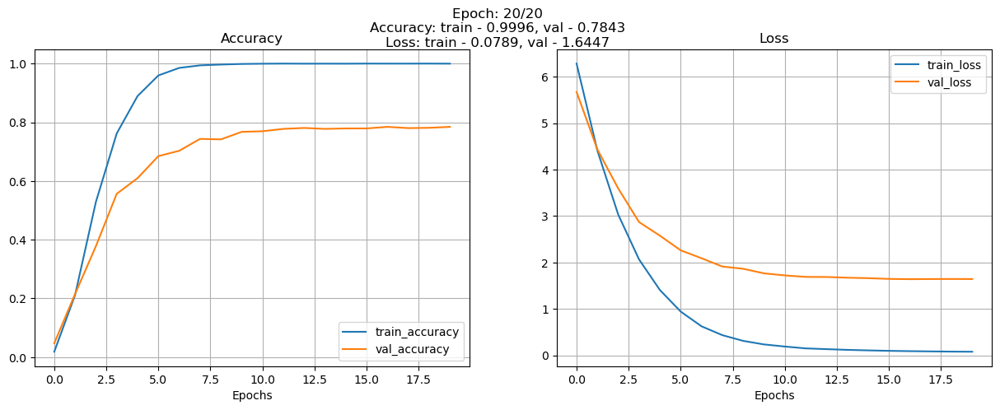

In [28]:
criterion = nn.CrossEntropyLoss()

model = ArcFaceClassifier(face_vector_size=256, num_classes=500, s=10, m=0.1).to(device)

optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

num_epochs = 20

train_accs = []
train_losses = []

val_accs = []
val_losses = []

for epoch in range(num_epochs):
    train_accuracy, train_loss = fit_epoch(model, train_loader, criterion, optimizer)
    train_accs.append(train_accuracy)
    train_losses.append(train_loss)
    
    val_accuracy, val_loss = eval_epoch(model, val_loader, criterion)
    val_accs.append(val_accuracy)
    val_losses.append(val_loss)
    
    clear_output(wait=True)
    plt.figure(figsize=(15, 5))

    plt.subplot(1, 2, 1)
    plt.plot(train_accs, label="train_accuracy")
    plt.plot(val_accs, label="val_accuracy")
    plt.legend(loc="best")
    plt.xlabel("Epochs")
    plt.grid()
    plt.title("Accuracy")
            
    plt.subplot(1, 2, 2)
    plt.plot(train_losses, label="train_loss")
    plt.plot(val_losses, label="val_loss")
    plt.legend(loc="best")
    plt.xlabel("Epochs")
    plt.grid()
    plt.title("Loss")
    
    plt.suptitle(f"Epoch: {epoch+1}/{num_epochs}\nAccuracy: train - {train_accuracy:0.4f}, val - {val_accuracy:0.4f}\nLoss: train - {train_loss:0.4f}, val - {val_loss:0.4f}")
    plt.show()

In [25]:
def evaluate(model, dataloader, loss_fn):

    losses = []

    num_correct = 0
    num_elements = 0

    for i, batch in enumerate(dataloader):
        
        X_batch, y_batch = batch['image'], batch['label']
        num_elements += len(y_batch)
        
        model.eval()
        with torch.no_grad():
            logits, _ = model(X_batch.to(device), y_batch.to(device))
            loss = loss_fn(logits, y_batch.to(device))
            
        losses.append(loss.item())
            
        y_pred = torch.argmax(logits, dim=1)
            
        num_correct += torch.sum(y_pred.cpu() == y_batch)
    
    accuracy = num_correct / num_elements
            
    return accuracy.numpy(), np.mean(losses)

In [31]:
test_accuracy, test_loss = evaluate(model, test_loader, nn.CrossEntropyLoss())
print(f"Test accuracy: {test_accuracy.item():0.4f}, test loss: {test_loss.item():0.4f}.")

Test accuracy: 0.7772, test loss: 1.6756.


Looks good - it is the best test accuracy among all our 3 models!

In [32]:
torch.save(model.state_dict(), "model_arcface.pth")

In [244]:
model = ArcFaceClassifier(face_vector_size=256, num_classes=500, s=10, m=0.1).to(device)
model.load_state_dict(torch.load("model_arcface.pth"));

test_accuracy, test_loss = evaluate(model, test_loader, nn.CrossEntropyLoss())
print(f"Test accuracy: {test_accuracy.item():0.4f}, test loss: {test_loss.item():0.4f}.")

Test accuracy: 0.7772, test loss: 1.6756.


Now let's compare models using IR metric.

In [41]:
query_embeddings = compute_embeddings(model, query_img_names, 'celebA_ir/celebA_query/')
distractors_embeddings = compute_embeddings(model, distractors_img_names, 'celebA_ir/celebA_distractors/')

In [43]:
cosine_query_pos = compute_cosine_query_pos(query_dict, query_img_names, 
                                            query_embeddings)
cosine_query_neg = compute_cosine_query_neg(query_dict, query_img_names, 
                                            query_embeddings)
cosine_query_distractors = compute_cosine_query_distractors(query_embeddings, 
                                                            distractors_embeddings)

In [46]:
thr_arcface = []
tpr_arcface = []
fpr_list = [0.5, 0.2, 0.1, 0.05, 0.01]
for fpr in fpr_list:
    x, y = compute_ir(cosine_query_pos, cosine_query_neg, cosine_query_distractors, fpr=fpr)
    thr_arcface.append(x)
    tpr_arcface.append(y)
print(f"TPR values: {tpr_arcface}")
print(f"Thresholds values: {thr_arcface}")

TPR values: [0.9512261395285646, 0.8441002649276543, 0.7492018205284967, 0.6403776917328986, 0.4199442972624142]
Thresholds values: [0.00022466175141744316, 0.08734498918056488, 0.13906382024288177, 0.1856224685907364, 0.28203070163726807]


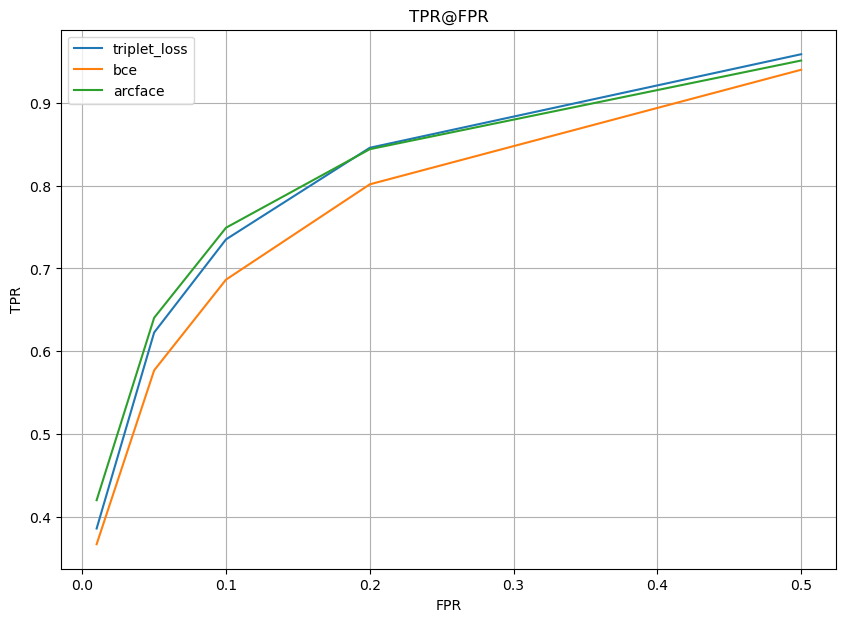

In [72]:
plt.figure(figsize=(10, 7))

plt.plot(fpr_list, tpr_triplet_loss, label="triplet_loss")
plt.plot(fpr_list, tpr_bce, label="bce")
plt.plot(fpr_list, tpr_arcface, label="arcface")
plt.legend(loc="best")
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.grid()
plt.title("TPR@FPR")
                
plt.show()

Looks good: ArcFace is the best one for FPR < 0.2 - I think it's the most interesting values range for FPR.

## Bonus task (0.5 points): Finding trash photos 

You have probably noticed that in identification rate calculation we use cosine similarity between embeddings, which includes embeddings' normalization. And in TripletLoss also we normalize embeddings before passing them to the loss. Actually this is how most of the face recognition algorithms work — they are designed to output a normalized embeddings and any comparison between embeddings is done after the embeddings are normalized. Sometimes it may be beneficial even to add a normalization layer (batchnorm or layernorm with fixed parameters) after the model's embedding layer to make the model output normalized embeddings.

But norms of the unnormalized embeddings can also be used. They can be used to detect trash photos — photos, where the face is presented really badly (e.g. back of the head instead of the forehead or even a photo without any head that has appeared in a dataset due to a mistake in face detection / landmarks detection algorithm).

Empirically it has been found that the higher the embedding's norm, the more the probability of the corresponding photo to be trash is. 



**Task**: get the embeddings of photos in a test set / query set / distractors set. Sort them by their norms. Output the photos whose embeddings norms are the highest. Do they look like normal or trash?

**Doing this task will not give you points above 100% for the whole homework. But if you have any mistakes in previous sections, doing this task may give you additional points (5% of total points) to cover points lost.**

We will use triplet_loss model, because it has unnormalized embeddings.

In [6]:
model = FaceEmbedder().to(device)
model.load_state_dict(torch.load("model_triplet.pth"));

In [10]:
query_embeddings = compute_embeddings_triplet(model, query_img_names, 'celebA_ir/celebA_query/')
distractors_embeddings = compute_embeddings_triplet(model, distractors_img_names, 'celebA_ir/celebA_distractors/')

Let's take a look at query embeddings with the biggest embeddings norm:

Top-6 query embeddings norm values: [25.885242 23.7813   23.070202 22.32482  21.732954 21.681585]


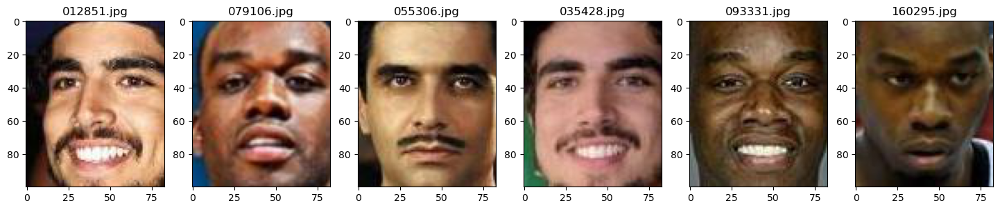

In [18]:
norm = torch.linalg.vector_norm(torch.tensor(query_embeddings), dim=1)
values, indices = torch.topk(norm, 6)
print(f"Top-6 query embeddings norm values: {values.numpy()}")

imgs = []
for index in indices.tolist():
    img = query_img_names[index]
    img = Image.open(os.path.join('celebA_ir/celebA_query/', img))
    imgs.append(np.array(img))

f, axes= plt.subplots(1, len(imgs), figsize=(3*len(imgs),5))
for i, axis in enumerate(axes):
    axes[i].imshow(imgs[i], cmap='gray')
    axes[i].set_title(images_names[i])
plt.show()

None of them looks like trash photo. Let's check distractors set:

Top-6 distractors embeddings norm values: [26.052889 26.037111 25.61946  25.398054 24.115765 23.220438]


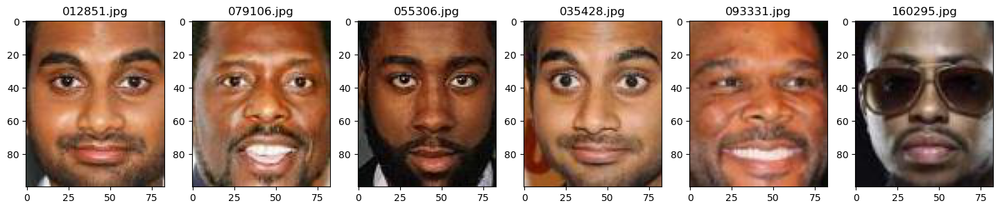

In [19]:
norm = torch.linalg.vector_norm(torch.tensor(distractors_embeddings), dim=1)
values, indices = torch.topk(norm, 6)
print(f"Top-6 distractors embeddings norm values: {values.numpy()}")

imgs = []
for index in indices.tolist():
    img = distractors_img_names[index]
    img = Image.open(os.path.join('celebA_ir/celebA_distractors/', img))
    imgs.append(np.array(img))

f, axes= plt.subplots(1, len(imgs), figsize=(3*len(imgs),5))
for i, axis in enumerate(axes):
    axes[i].imshow(imgs[i], cmap='gray')
    axes[i].set_title(images_names[i])
plt.show()

The same situation: none of pictures are trashy. May me we should take a look at pictures with the minimal norm:

Bottom-6 query embeddings norm values: [6.4713707 6.5156655 6.7265563 6.7616105 6.85184   6.890043 ]


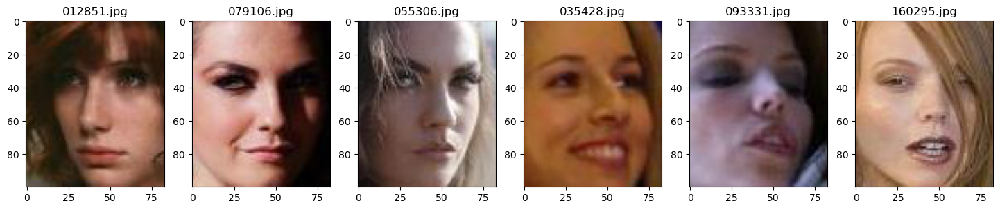

Bottom-6 distractors embeddings norm values: [6.169363  6.1763067 6.2591763 6.316415  6.384999  6.406815 ]


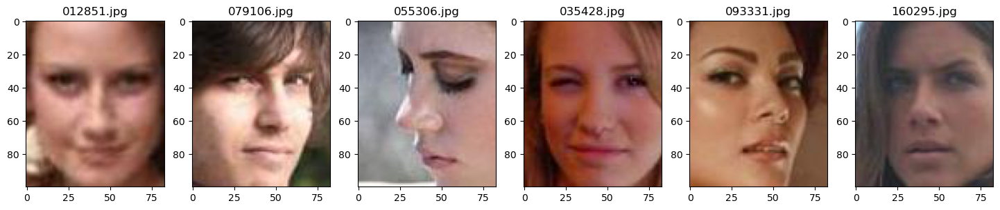

In [24]:
norm = torch.linalg.vector_norm(torch.tensor(query_embeddings), dim=1)
values, indices = torch.topk(norm, 6, largest=False)
print(f"Bottom-6 query embeddings norm values: {values.numpy()}")

imgs = []
for index in indices.tolist():
    img = query_img_names[index]
    img = Image.open(os.path.join('celebA_ir/celebA_query/', img))
    imgs.append(np.array(img))

f, axes= plt.subplots(1, len(imgs), figsize=(3*len(imgs),5))
for i, axis in enumerate(axes):
    axes[i].imshow(imgs[i], cmap='gray')
    axes[i].set_title(images_names[i])
plt.show()

norm = torch.linalg.vector_norm(torch.tensor(distractors_embeddings), dim=1)
values, indices = torch.topk(norm, 6, largest=False)
print(f"Bottom-6 distractors embeddings norm values: {values.numpy()}")

imgs = []
for index in indices.tolist():
    img = distractors_img_names[index]
    img = Image.open(os.path.join('celebA_ir/celebA_distractors/', img))
    imgs.append(np.array(img))

f, axes= plt.subplots(1, len(imgs), figsize=(3*len(imgs),5))
for i, axis in enumerate(axes):
    axes[i].imshow(imgs[i], cmap='gray')
    axes[i].set_title(images_names[i])
plt.show()

Looks like bigger embedding norm corresponds to black men and smallest norm corresponds to white women in our case. Maybe there are no trash photos in this dataset.

## What's next

What else can you do with this homework:
1. Try to train the network on faces which are aligned differently (or not aligned at all). The dataset [can be downloaded here](https://drive.google.com/drive/folders/0B7EVK8r0v71pTUZsaXdaSnZBZzg?resourcekey=0-rJlzl934LzC-Xp28GeIBzQ)
2. Try to mix different losses while training. This often helps.
3. Try other losses from [this](https://arxiv.org/pdf/1901.05903.pdf) paper
4. Train bigger model on bigger dataset, as whole celebA, add [LFW](http://vis-www.cs.umass.edu/lfw/) and other
5. Explore embeddings spaces you get out of different models. How well are embeddings clasterized? Are they evenly spreaded on the sphere? How could you suggest to make it better?

We will use pretrained network for face detection and alignment to make something like full face recognition pipeline - and test it on a couple of images. We use facenet_pytorch basing on this article: https://debuggercafe.com/automatic-face-and-facial-landmark-detection-with-facenet-pytorch/

In [ ]:
!pip install facenet_pytorch-2.5.2-py3-none-any.whl

In [17]:
from facenet_pytorch import MTCNN

mtcnn = MTCNN(keep_all=True, device=device)

def draw_bbox(bounding_boxes, image):
    for i in range(len(bounding_boxes)):
        x1, y1, x2, y2 = bounding_boxes[i]
        cv2.rectangle(image, (int(x1), int(y1)), (int(x2), int(y2)),
                     (0, 255, 255), 2)
    
    return image

def plot_landmarks(landmarks, image):
    for i in range(len(landmarks)):
        for p in range(landmarks[i].shape[0]):
            cv2.circle(image, 
                      (int(landmarks[i][p, 0]), int(landmarks[i][p, 1])),
                      2, (0, 255, 255), -1, cv2.LINE_AA)
    return image

First image - black and white photo of Anita Ekberg. Her image is the first in os.listdir for celebA_train dataset. Our goal is to extract embedding from this photo and find her other photos in our dataset.

In [361]:
# read the image 
image = Image.open('anita.webp').convert('RGB')

# create an image array copy so that we can use OpenCV functions on it
image_array = np.array(image, dtype=np.float32)

# cv2 image color conversion
image_array = cv2.cvtColor(image_array, cv2.COLOR_RGB2BGR)

bounding_boxes, conf, landmarks = mtcnn.detect(image, landmarks=True)

In [362]:
# draw the bounding boxes around the faces
image_array = draw_bbox(bounding_boxes, image_array)

# plot the facial landmarks
image_array = plot_landmarks(landmarks, image_array)

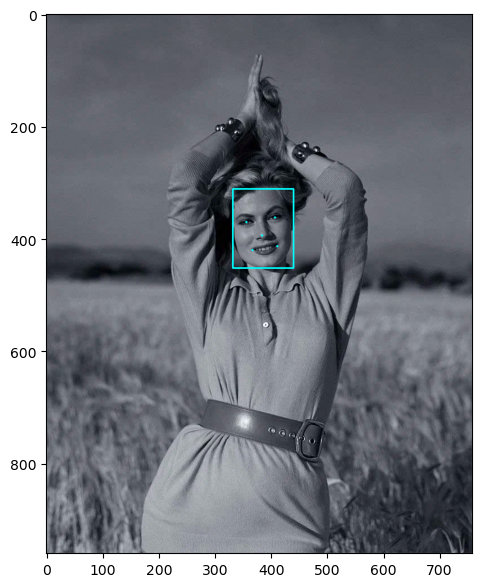

In [363]:
plt.figure(figsize=(10, 7))
plt.imshow(image_array/255)
plt.show()

Crop image to the found face bbox and resize it to our standart 83x100 size.

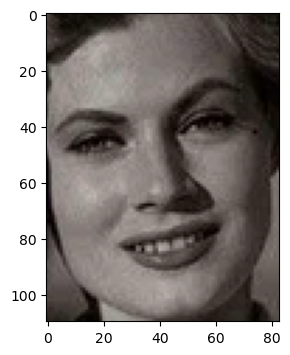

In [364]:
img = image.crop(bounding_boxes[0])

w, h = img.size

new_w = 83
new_h = int(new_w * h / w)

img = img.resize((new_w, new_h), Image.Resampling.LANCZOS)

plt.figure(figsize=(3, 4))
plt.imshow(img)
plt.show()

Calc face features for this image.

In [365]:
tensor = transform(img).to(device)
tensor = tensor[None, :, :, :]
tensor.shape

torch.Size([1, 3, 224, 224])

In [366]:
model.eval()
with torch.no_grad():
    _, anita_face_features = model(tensor)

Now let's calculate embeddings for all images from celebA_imgs.

In [165]:
def compute_embeddings(model, images_list, folder_name):      
    celeba_images_size = 83
    imagenet_images_size = 224
    transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.CenterCrop(celeba_images_size),
        transforms.Resize(imagenet_images_size),
        transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225)),
    ])
    a = 47
    b = 75
    images = [transform(Image.open(os.path.join(folder_name, x)).crop((a, b, 83+a, 100+b))) for x in images_list]
        
    face_features_list = []
    
    model.eval()
    with torch.no_grad():
        for image in images:
            image = image[None, :, :, :]
            _, face_features = model(image.to(device))
            face_features_list.append(face_features.tolist()[0])
    return face_features_list

images_names = os.listdir('./celebA_train_500/celebA_imgs/')

all_train_embeddings = compute_embeddings(model, images_names, 'celebA_train_500/celebA_imgs/')

Calculate pairwise similarity for Anita's photo embedding and all other embeddings.

In [367]:
pairwise_similarity = pairwise_cosine_similarity(anita_face_features.detach().cpu(),
                                                 torch.tensor(all_train_embeddings))

Show top-6 similar photos from our dataset.

Top-6 biggest cosine similarities: [0.39782745 0.3786773  0.37085015 0.36526018 0.3641709  0.3637177 ]


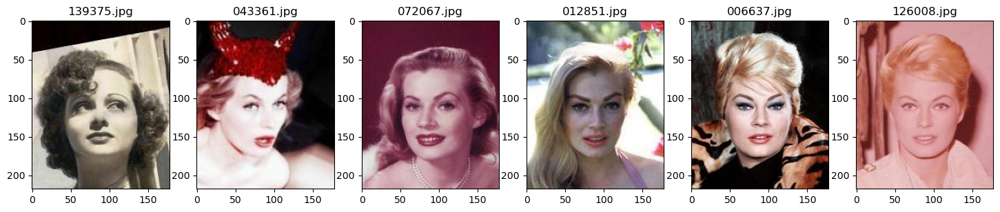

In [369]:
values, indices = torch.topk(pairwise_similarity.squeeze(), 6)
print(f"Top-6 biggest cosine similarities: {values.numpy()}")

imgs = []
for index in indices.tolist():
    img = images_names[index]
    img = Image.open(os.path.join('celebA_train_500/celebA_imgs', img))
    imgs.append(np.array(img))

f, axes= plt.subplots(1, len(imgs), figsize=(3*len(imgs),5))
for i, axis in enumerate(axes):
    axes[i].imshow(imgs[i], cmap='gray')
    axes[i].set_title(images_names[indices[i]])
plt.show()

The first picture is another black and white photo of some actress, but others are definetely Anita's photos. So, our pipeline works!

Now let's use the same pipeline for my telegram avatar.

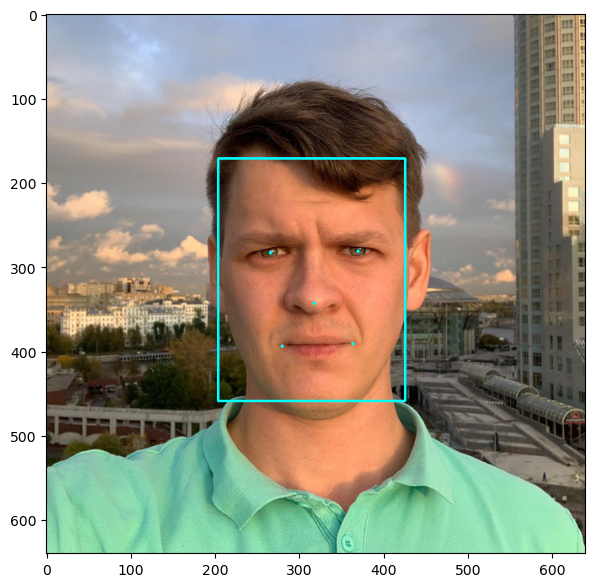

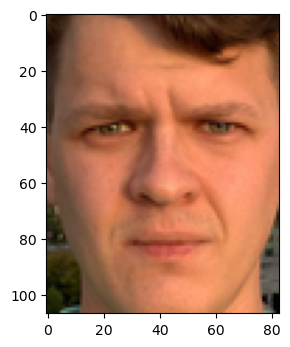

Top-6 biggest cosine similarities: [0.53000355 0.4825355  0.45810682 0.44652104 0.4455285  0.4427662 ]


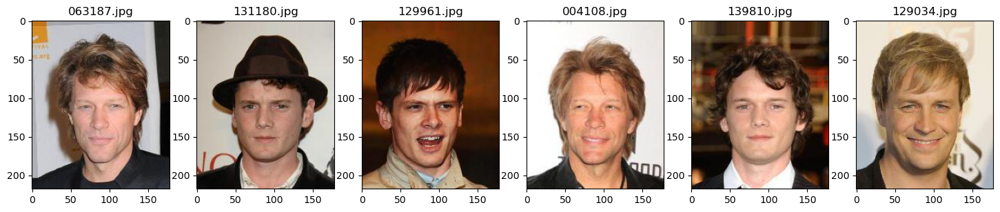

In [377]:
image = Image.open('my_telegram_photo.jpg').convert('RGB')
bounding_boxes, conf, landmarks = mtcnn.detect(image, landmarks=True)

# create an image array copy so that we can use OpenCV functions on it
image_array = np.array(image, dtype=np.float32)

# draw the bounding boxes around the faces
image_array = draw_bbox(bounding_boxes, image_array)

# plot the facial landmarks
image_array = plot_landmarks(landmarks, image_array)

plt.figure(figsize=(10, 7))
plt.imshow(image_array/255)
plt.show()

img = image.crop(bounding_boxes[0])

w, h = img.size
new_w = 83
new_h = int(new_w * h / w)

img = img.resize((new_w, new_h), Image.Resampling.LANCZOS)

plt.figure(figsize=(3, 4))
plt.imshow(img)
plt.show()

tensor = transform(img).to(device)
tensor = tensor[None, :, :, :]

model.eval()
with torch.no_grad():
    _, face_features = model(tensor)
    
pairwise_similarity = pairwise_cosine_similarity(face_features.detach().cpu(),
                                                 torch.tensor(all_train_embeddings))

values, indices = torch.topk(pairwise_similarity.squeeze(), 6)
print(f"Top-6 biggest cosine similarities: {values.numpy()}")

imgs = []
for index in indices.tolist():
    img = images_names[index]
    img = Image.open(os.path.join('celebA_train_500/celebA_imgs', img))
    imgs.append(np.array(img))

f, axes= plt.subplots(1, len(imgs), figsize=(3*len(imgs),5))
for i, axis in enumerate(axes):
    axes[i].imshow(imgs[i], cmap='gray')
    axes[i].set_title(images_names[indices[i]])
plt.show()

Jon Bon Jovi and Anton Yelchin - not bad. Let's try again with another Anita's photo.

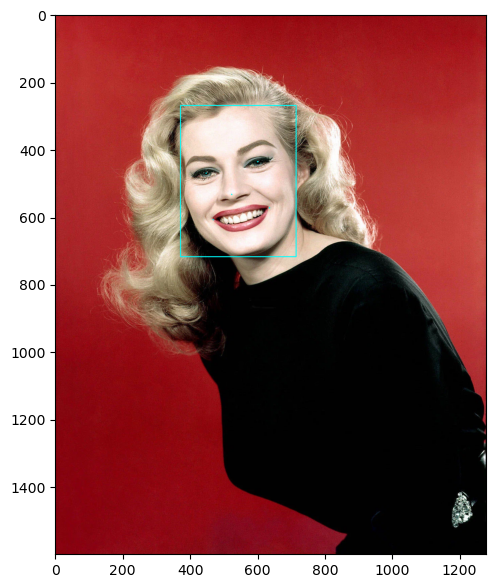

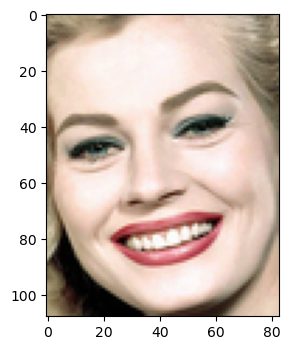

Top-6 biggest cosine similarities: [0.5472579  0.5400437  0.5399022  0.53561056 0.5349978  0.53369975]


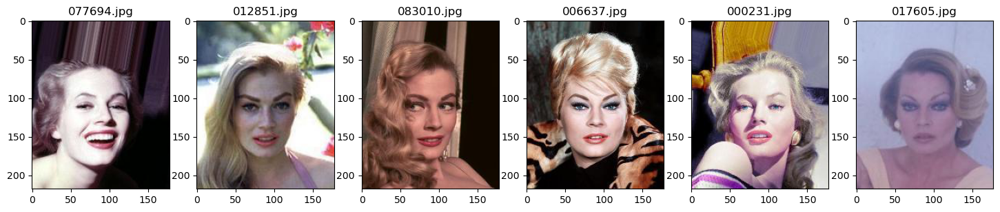

In [409]:
image = Image.open('anita2.webp').convert('RGB')
bounding_boxes, conf, landmarks = mtcnn.detect(image, landmarks=True)

# create an image array copy so that we can use OpenCV functions on it
image_array = np.array(image, dtype=np.float32)

# draw the bounding boxes around the faces
image_array = draw_bbox(bounding_boxes, image_array)

# plot the facial landmarks
image_array = plot_landmarks(landmarks, image_array)

plt.figure(figsize=(10, 7))
plt.imshow(image_array/255)
plt.show()

img = image.crop(bounding_boxes[0])

w, h = img.size
new_w = 83
new_h = int(new_w * h / w)

img = img.resize((new_w, new_h), Image.Resampling.LANCZOS)

plt.figure(figsize=(3, 4))
plt.imshow(img)
plt.show()

tensor = transform(img).to(device)
tensor = tensor[None, :, :, :]

model.eval()
with torch.no_grad():
    _, face_features = model(tensor)
    
pairwise_similarity = pairwise_cosine_similarity(face_features.detach().cpu(),
                                                 torch.tensor(all_train_embeddings))

values, indices = torch.topk(pairwise_similarity.squeeze(), 6)
print(f"Top-6 biggest cosine similarities: {values.numpy()}")

imgs = []
for index in indices.tolist():
    img = images_names[index]
    img = Image.open(os.path.join('celebA_train_500/celebA_imgs', img))
    imgs.append(np.array(img))

f, axes= plt.subplots(1, len(imgs), figsize=(3*len(imgs),5))
for i, axis in enumerate(axes):
    axes[i].imshow(imgs[i], cmap='gray')
    axes[i].set_title(images_names[indices[i]])
plt.show()

I think it's pretty good quality for AlexNet backbone!

## Let's train face align model

Images size (width, height): (178, 218).


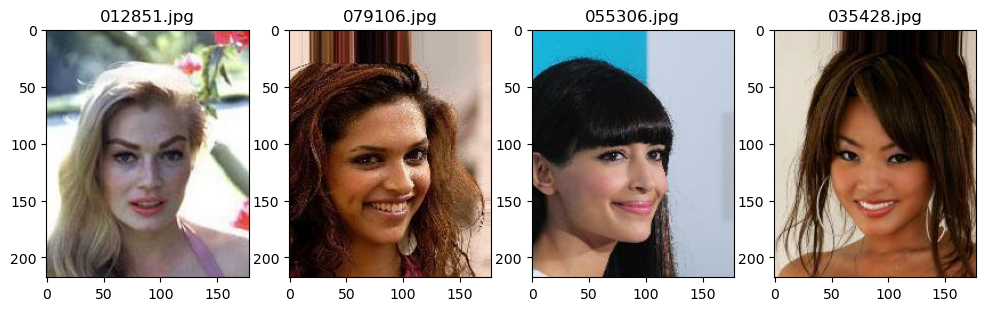

In [425]:
def show_imgs(images_names):
    imgs = []
    for img in images_names:
        img = Image.open(os.path.join('celebA_train_500/celebA_imgs/', img))
        imgs.append(np.array(img))
        
    print(f"Images size (width, height): {img.size}.")

    f, axes= plt.subplots(1, len(imgs), figsize=(3*len(imgs),5))
    for i, axis in enumerate(axes):
        axes[i].imshow(imgs[i], cmap='gray')
        axes[i].set_title(images_names[i])
    plt.show()

images_names = os.listdir('./celebA_train_500/celebA_imgs/')[:4]
show_imgs(images_names)

In [419]:
f = open('list_landmarks_align_celeba.csv', 'r')
data = f.readlines()
f.close()

landmarks_data = {}
for i in range(1, len(data)):
    splitted = data[i].strip().split(',')
    image_name = splitted[0]
    rows = [[splitted[1], splitted[2]],
            [splitted[3], splitted[4]],
            [splitted[5], splitted[6]],
            [splitted[7], splitted[8]],
            [splitted[9], splitted[10]]]
    landmarks_data[image_name] = np.array(rows, int)

Images size (width, height): (178, 218).


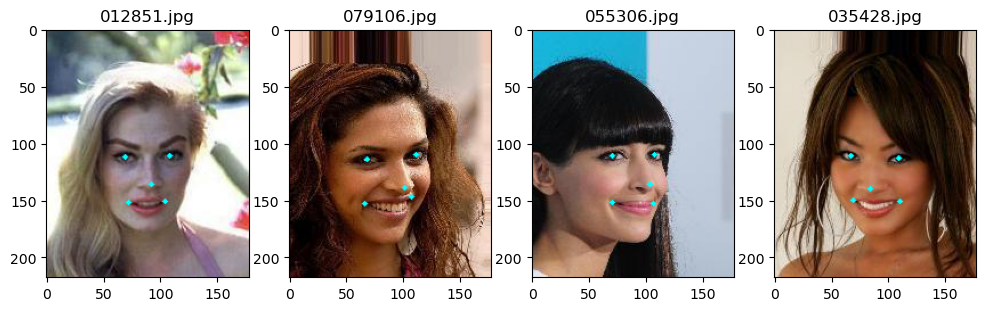

In [472]:
def plot_landmarks(landmarks, image):
    landmarks = [landmarks]
    for i in range(len(landmarks)):
        for p in range(landmarks[i].shape[0]):
            cv2.circle(image, 
                      (int(landmarks[i][p, 0]), int(landmarks[i][p, 1])),
                      2, (0, 255, 255), -1, cv2.LINE_AA)
    return image

def show_imgs(images_names):
    imgs = []
    for img in images_names:
        img = Image.open(os.path.join('celebA_train_500/celebA_imgs/', img))
        imgs.append(np.array(img))
        
    print(f"Images size (width, height): {img.size}.")

    f, axes= plt.subplots(1, len(imgs), figsize=(3*len(imgs),5))
    for i, axis in enumerate(axes):
        image_name = images_names[i]
        landmarks = landmarks_data[image_name]
        image = plot_landmarks(landmarks, imgs[i])
        axes[i].imshow(image, cmap='gray')
        axes[i].set_title(image_name)
    plt.show()

images_names = os.listdir('./celebA_train_500/celebA_imgs/')[:4]
show_imgs(images_names)

In [509]:
def get_paths(dataset_type='train'):
    '''
    a function that returnes list of images paths for a given type of the dataset
    params:
      dataset_type: one of 'train', 'val', 'test'
    '''

    labels_dict = {
        'train': 0,
        'val': 1,
        'test': 2,
    }

    f = open('celebA_train_500/celebA_train_split.txt', 'r')
    lines = f.readlines()
    f.close()

    lines = [x.strip().split() for x in lines]
    lines = [x[0] for x in lines if int(x[1]) == labels_dict[dataset_type]]

    images_paths = []
    for filename in lines:            
        images_paths.append(os.path.join('celebA_train_500/celebA_imgs/', filename))
    
    return np.array(images_paths)


class celebADatasetLandmarks(Dataset):
    """Feel free to rewrite it. For ex. cache all images in RAM to increase training speed"""
    def __init__(self, dataset_type, transform, aug=None):
        self.images_paths = get_paths(dataset_type=dataset_type)

        f = open('list_landmarks_align_celeba.csv', 'r')
        data = f.readlines()
        f.close()

        landmarks_data = {}
        for i in range(1, len(data)):
            splitted = data[i].strip().split(',')
            image_name = splitted[0]
            rows = [[splitted[1], splitted[2]],
                    [splitted[3], splitted[4]],
                    [splitted[5], splitted[6]],
                    [splitted[7], splitted[8]],
                    [splitted[9], splitted[10]]]
            landmarks_data[image_name] = np.array(rows, int)
        self.landmarks_data = landmarks_data
        
        self.aug = aug
        
        self.images = [transform(Image.open(x)) for x in self.images_paths]
        
    
    def __len__(self):
        return len(self.images)
    
    def __getitem__(self, idx):        
        image_name = self.images_paths[idx].split('/')[-1]
        label = self.landmarks_data[image_name]
        new_label = []
        for row in label:
            new_row = []
            new_row.append((row[0] + 23) / 224.0)
            new_row.append((row[1] + 3) / 224.0)
            new_label.append(new_row)
        
        if self.aug:
            image = self.aug(self.images[idx])
        else:
            image = self.images[idx]
        
        sample = {
            'image': image,
            'label': np.array(new_label, float),
        }

        return sample

In [557]:
transform = transforms.Compose([
      transforms.ToTensor(),
      transforms.Pad((23, 3)),
      transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225)),
])

aug = transforms.Compose([
      transforms.RandomHorizontalFlip(),
])

train_data = celebADatasetLandmarks('train', transform)
val_data = celebADatasetLandmarks('val', transform)
test_data = celebADatasetLandmarks('test', transform)

batch_size = 128
train_loader = torch.utils.data.DataLoader(train_data, batch_size=batch_size, shuffle=True)
val_loader = torch.utils.data.DataLoader(val_data, batch_size=batch_size, shuffle=False)
test_loader = torch.utils.data.DataLoader(test_data, batch_size=batch_size, shuffle=False)

torch.Size([128, 3, 224, 224])
torch.Size([128, 5, 2])


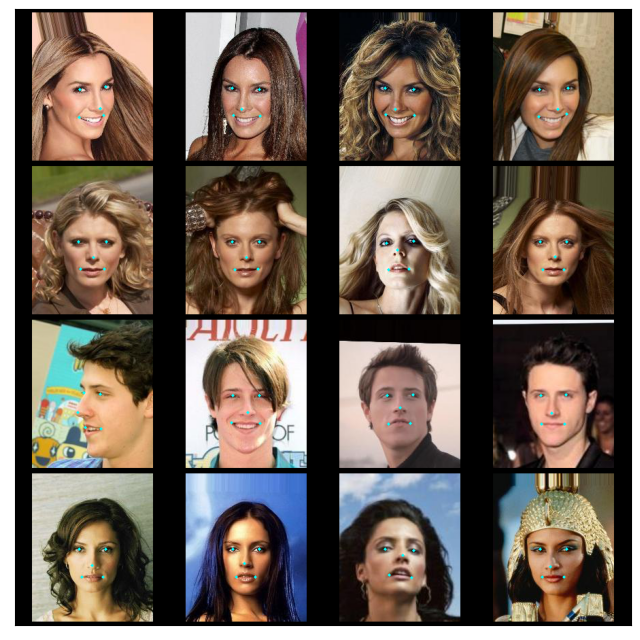

In [558]:
transform_without_norm = transforms.Compose([
      transforms.ToTensor(),
      transforms.Pad((23, 3)),
])

data_for_demo = celebADatasetLandmarks('test', transform_without_norm)
loader_for_demo = torch.utils.data.DataLoader(data_for_demo, batch_size=batch_size, shuffle=False)

def plot_landmarks(landmarks, image):
    landmarks = [landmarks]
    for i in range(len(landmarks)):
        for p in range(landmarks[i].shape[0]):
            cv2.circle(image, 
                      (int(landmarks[i][p, 0]), int(landmarks[i][p, 1])),
                      2, (0, 1, 1), -1, cv2.LINE_AA)
    return image

def show_images(images, landmarks_data, nmax=16):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    imgs = images[:nmax].numpy()
    new_imgs = []
    for i, img in enumerate(imgs):
        landmarks = 224*landmarks_data[i].numpy()
        new_img = img.transpose((1, 2, 0)).copy() 
        new_img = plot_landmarks(landmarks, new_img)
        new_imgs.append(new_img)
    new_imgs = torch.tensor(np.stack(new_imgs, axis=0)).permute(0, 3, 1, 2)
    ax.imshow(make_grid(new_imgs[:nmax], nrow=4).permute(1, 2, 0))

for batch in loader_for_demo:
    break
    
print(batch['image'].shape)
print(batch['label'].shape)

show_images(batch['image'], batch['label'], 16)

In [533]:
class FaceAligner(nn.Module):
    def __init__(self):
        super().__init__()
        self.pretrained_model = models.alexnet(pretrained=True)
        self.face_aligner = nn.Sequential(
            nn.ReLU(),
            nn.Dropout(p=0.5),
            nn.Linear(1000, 200),
            nn.ReLU(),
            nn.Dropout(p=0.2),
            nn.Linear(200, 50),
            nn.ReLU(),
            nn.Linear(50, 10),
        )      
        
    def forward(self, x):
        x = self.pretrained_model(x)
        landmarks = self.face_aligner(x)
        
        return torch.reshape(landmarks, (-1, 5, 2)).to(torch.float64)

In [542]:
def fit_epoch(model, train_loader, criterion, optimizer):
    total_loss = 0
    num_batches = 0
    for batch in train_loader:
        images = batch['image'].to(device)
        target = batch['label'].to(device)
        
        model.train()
        optimizer.zero_grad()
        landmarks = model(images)
        
        loss = criterion(landmarks, target)
        loss.backward()
        optimizer.step()
        
        total_loss += loss.item()
        num_batches += 1

    train_loss = total_loss / num_batches
    return train_loss

def eval_epoch(model, val_loader, criterion):
    total_loss = 0
    num_batches = 0
    for batch in val_loader:
        images = batch['image'].to(device)
        target = batch['label'].to(device)
        
        model.eval()
        with torch.no_grad():
            landmarks = model(images)
            loss = criterion(landmarks, target)
            
        total_loss += loss.item()
        num_batches += 1

    val_loss = total_loss / num_batches
    return val_loss

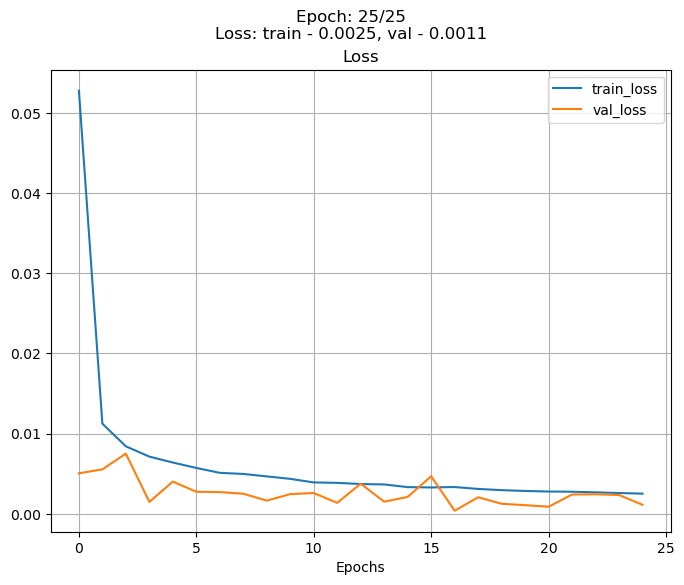

In [543]:
criterion = nn.MSELoss()

model = FaceAligner().to(device)

optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

num_epochs = 25

train_losses = []
val_losses = []

for epoch in range(num_epochs):
    train_loss = fit_epoch(model, train_loader, criterion, optimizer)
    train_losses.append(train_loss)
    
    val_loss = eval_epoch(model, val_loader, criterion)
    val_losses.append(val_loss)
    
    clear_output(wait=True)
    plt.figure(figsize=(8, 6))
            
    plt.plot(train_losses, label="train_loss")
    plt.plot(val_losses, label="val_loss")
    plt.legend(loc="best")
    plt.xlabel("Epochs")
    plt.grid()
    plt.title("Loss")
    
    plt.suptitle(f"Epoch: {epoch+1}/{num_epochs}\nLoss: train - {train_loss:0.4f}, val - {val_loss:0.4f}")
    plt.show()

In [544]:
torch.save(model.state_dict(), "model_aligner.pth")

In [547]:
def evaluate(model, dataloader, loss_fn):

    losses = []

    for i, batch in enumerate(dataloader):
        
        X_batch, y_batch = batch['image'], batch['label']

        model.eval()
        with torch.no_grad():
            landmarks = model(X_batch.to(device))
            loss = loss_fn(landmarks, y_batch.to(device))
            
        losses.append(loss.item())
            
    return np.mean(losses)

In [548]:
test_loss = evaluate(model, test_loader, nn.MSELoss())
print(f"Test loss: {test_loss.item():0.4f}.")

Test loss: 0.0011.


torch.Size([128, 5, 2])


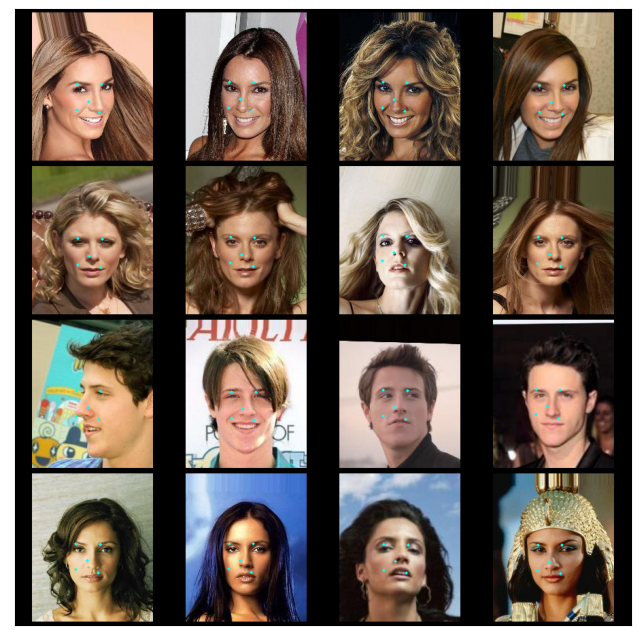

In [561]:
def plot_landmarks(landmarks, image):
    landmarks = [landmarks]
    for i in range(len(landmarks)):
        for p in range(landmarks[i].shape[0]):
            cv2.circle(image, 
                      (int(landmarks[i][p, 0]), int(landmarks[i][p, 1])),
                      2, (0, 1, 1), -1, cv2.LINE_AA)
    return image

def show_images(images, landmarks_data, nmax=16):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    imgs = images[:nmax].numpy()
    new_imgs = []
    for i, img in enumerate(imgs):
        landmarks = 224*landmarks_data[i].numpy()
        new_img = img.transpose((1, 2, 0)).copy() 
        new_img = plot_landmarks(landmarks, new_img)
        new_imgs.append(new_img)
    new_imgs = torch.tensor(np.stack(new_imgs, axis=0)).permute(0, 3, 1, 2)
    ax.imshow(make_grid(new_imgs[:nmax], nrow=4).permute(1, 2, 0))

for batch in loader_for_demo:
    break
    
images_norm = batch['image']
label = batch['label']

for batch in test_loader:
    break

images = batch['image']

model.eval()
with torch.no_grad():
    landmarks = model(images.to(device))
    
print(landmarks.shape)

show_images(images_norm, landmarks.detach().cpu(), 16)

Looks bad, but at least we tried...